In [1]:
import cooler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing as mp
import h5py
import pickle
import seaborn as sns
import tqdm

from scipy import stats

from statsmodels.stats.multitest import multipletests

import sys
import itertools
import time

sys.path.insert(0, '/cndd/fangming/CEMBA/snmcseq_dev')
from __init__ import *
from __init__jupyterlab import * 
import snmcseq_utils

from enhancer_gene_hic_validation_utils import *

In [2]:
default_colorbar_kws = DEFAULT_COLORBAR_KWS

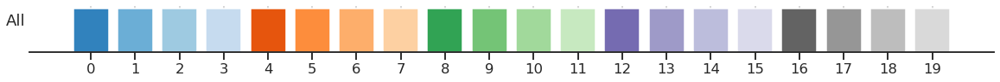

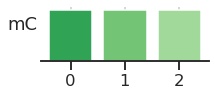

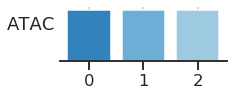

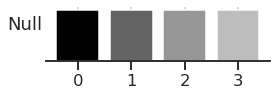

In [3]:
# color palette
cm = plt.cm.tab20c.colors

# settle down on a color palette
colors_mc = [cm[8], cm[9], cm[10],]
colors_atac = [cm[0], cm[1], cm[2],]
colors_null = ['black', cm[16], cm[17], cm[18],]

color_tracks = [
    cm,
    colors_mc,
    colors_atac,
    colors_null,
]

labels = [
    'All',
    'mC',
    'ATAC',
    'Null',
]

for color_track, label in zip(color_tracks, labels):
    n = len(color_track)
    fig, ax = plt.subplots(figsize=(1*n,1))
    ax.bar(np.arange(n), 1, 
           color=color_track)
    ax.set_xticks(np.arange(n))
    ax.set_ylabel(label, rotation=0, ha='right')
    sns.despine(ax=ax, left=True)
    ax.set_yticks([])
    plt.show()

In [4]:
mod_palette = {
    'mc': 'C2',
    'atac': 'C0',
    'null': 'k',
}

mod_palette_comp = {
    'mc': colors_mc,
    'atac': colors_atac,
    'null': colors_null,
}


KB = 1000
def p25(x):
    return np.percentile(x, 25)
def p75(x):
    return np.percentile(x, 75)


In [5]:
def ttest_routine(contacts_mean, contacts_std, contacts_n, 
                  contacts_sig_pairs_mean,
                  contacts_sig_pairs_std,
                  contacts_sig_pairs_n,
                  p_th1=0.05, p_th2=0.001):
    """
    """
    # vs background
    mean_fcs_bck = collections.OrderedDict()
    padjs_bck = collections.OrderedDict()
    for key, item in contacts_sig_pairs_mean.items():
        # mean FC
        mean_fcs_bck[key] = item/contacts_mean

        # significance t-test
        t, p = stats.ttest_ind_from_stats(contacts_mean, contacts_std, contacts_n, 
                                          contacts_sig_pairs_mean[key],
                                          contacts_sig_pairs_std[key],
                                          contacts_sig_pairs_n[key],
                                          equal_var=True)
        # multiple comparison 
        _, padj, _, _ = multipletests(p, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)

        # 
        padjs_bck[key] = padj

    # vs correlated
    mean_fcs_correlated = collections.OrderedDict()
    padjs_correlated = collections.OrderedDict()
    for key, item in contacts_sig_pairs_mean.items():
        if key.startswith('linked_'):
            # mean FC
            key_matched = key.replace('linked_', 'correlated_') 
            mean_fcs_correlated[key] = item/contacts_sig_pairs_mean[key_matched]

            # significance t-test
            t, p = stats.ttest_ind_from_stats( 
                                              contacts_sig_pairs_mean[key_matched],
                                              contacts_sig_pairs_std[key_matched],
                                              contacts_sig_pairs_n[key_matched],
                                              contacts_sig_pairs_mean[key],
                                              contacts_sig_pairs_std[key],
                                              contacts_sig_pairs_n[key],
                                              equal_var=True)
            # multiple comparison 
            _, padj, _, _ = multipletests(p, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)

            # 
            padjs_correlated[key] = padj
            
    return mean_fcs_bck, padjs_bck, mean_fcs_correlated, padjs_correlated
    

In [6]:
def aggregate_mean_std(mu, sigma, n):
    """Given a list of mu, sigma, n 
    return the aggregated mu, sigma, n    
    """
    mu = np.array(mu)
    sigma = np.array(sigma)
    n = np.array(n)
    
    # add robustness to n=0, mu and sigma=np.nan
    cond = (n!=0)
    n = n[cond].copy()
    mu = mu[cond].copy()
    sigma = sigma[cond].copy()
    
    n_agg = np.sum(n)
    
    ratio = n/n_agg
    mu_agg = np.dot(ratio, mu)
    sigma_agg = np.sqrt(np.dot(ratio, np.power(sigma, 2)) 
                      + np.dot(ratio, np.power((mu-mu_agg), 2))
                       )
    return mu_agg, sigma_agg, n_agg

def aggregate_mean_std_matrix(mu, sigma, n):
    """Given a matrix of mu, sigma, n  
    return the aggregated array mu, sigma, n (remove the first matrix axis) 
    """
    mu = np.array(mu)
    sigma = np.array(sigma)
    n = np.array(n)
    nrow, ncol = mu.shape
    
    mu_agg_all = []
    sigma_agg_all = []
    n_agg_all = []
    for col_idx in np.arange(ncol):
        mu_agg, sigma_agg, n_agg = aggregate_mean_std(mu[:,col_idx], sigma[:,col_idx], n[:,col_idx])
        mu_agg_all.append(mu_agg)
        sigma_agg_all.append(sigma_agg)
        n_agg_all.append(n_agg)
        
    return np.array(mu_agg_all), np.array(sigma_agg_all), np.array(n_agg_all)

In [7]:
def plot2(distances, track_names, mean_fc_all, celltype_palette, output_fig, 
          ylim=[-0.7, 0.7], yticks=[-0.5, 0, 0.5],
         ):
    """
    """
    fig, axs = plt.subplots(2, 3, figsize=(5*3,5*2), sharex=True,)
    for idx, row in mean_fc_all.iterrows():
        celltype = row['celltype']
        for ax, track_name, in zip(axs.flat, track_names,):
            ax.plot(distances, np.clip(np.log2(row['mean_fc'][track_name]), -1, 1), 
                    label=celltype, color=celltype_palette[celltype],
                   )
            
    for ax, track_name, in zip(axs.flat, track_names,):
        ax.xaxis.set_major_formatter(mtick.EngFormatter())
        ax.set_xlabel('Genomic distance')
        ax.set_xlim([0, 1e5])
        ax.set_ylim(ylim)
        ax.set_yticks(yticks)

        ax.set_title(track_name)
        ax.axhline(0, linestyle='--', color='gray')

    axs.flat[0].set_ylabel('log2 FC')
    ax.legend(bbox_to_anchor=(1,1), loc='upper left')

    # fig.suptitle("", fontsize=20)
    snmcseq_utils.savefig(fig, output_fig)
    plt.show() 
    return 

In [8]:
def plot3(distances, mean_fc_all, 
          track_names, 
          p_adjs,
          output_fig, 
          ylim=[-0.3, 0.6], 
          yticks=[-0.3,0,0.3,0.6],
         ):
    """
    """
    
    ys = {track_name: [] for track_name in track_names}
    for idx, row in mean_fc_all.iterrows():
        celltype = row['celltype']
        for track_name in track_names:
            ys[track_name].append(
                np.clip(np.log2(row['mean_fc'][track_name]), -1, 1)
                )

    for track_name in track_names:
        ys[track_name] = np.array(ys[track_name])

    ys_mean = {track_name: np.nanmean(ys[track_name], axis=0) for track_name in track_names}
    ys_std = {track_name: np.nanstd(ys[track_name], axis=0) for track_name in track_names}
    ys_err = {track_name: ys_std[track_name]*1.96/np.sqrt(8) for track_name in track_names}

    p_adjs = {'mc': [], 'atac': [], 'both': [],}

    # t test compare linked vs correlated
    num_celltypes, num_dists = ys['linked_mc'].shape
    for catg in ['mc', 'atac', 'both']:
        for i in np.arange(num_dists):
            _a = ys['linked_{}'.format(catg)][:, i]
            _b = ys['correlated_{}'.format(catg)][:, i]
            _t, _pval = stats.ttest_rel(_a, _b)

            # multiple comparison 
            _, p_adj, _, _ = multipletests(_pval, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)

            # 
            p_adjs[catg].append(p_adj)


    fig, axs = plt.subplots(1, 3, figsize=(5*3,5), sharey=True, sharex=True)
    for i, (ax, _type) in enumerate(zip(axs, ['mc', 'atac', 'both'])):
        for track_name in track_names:
            color = track_palette[track_name]
            if track_name.endswith(_type):
                pvals = p_adjs[_type]
                for idx, dist in enumerate(distances):
                    if pvals[idx] < p_th2:
                        ax.text(dist, -0.3, '*\n*\n*', fontsize=15, linespacing=0.3, ha='center')
                    elif pvals[idx] < p_th1: 
                        ax.text(dist, -0.3, '*', fontsize=15, ha='center')

                ax.fill_between(distances, 
                        ys_mean[track_name]-ys_err[track_name], 
                        ys_mean[track_name]+ys_err[track_name], 
                        color=color,
                        alpha=0.2
                       )
                ax.plot(distances, ys_mean[track_name], 
                        label=track_name, color=color,
                        linewidth=5,
                       )
        ax.axhline(0, linestyle='--', color='gray')
        
        ax.set_title(_type)
        ax.set_xlabel('Genomic distance')
        if i == 0:
            ax.set_ylabel('log2(FC)\n(+/- 95% CI; n=8 cell types)')
            ax.xaxis.set_major_formatter(mtick.EngFormatter())
            ax.set_xlim([-5e3, 1.05*1e5])
            ax.set_ylim(ylim)
            ax.set_yticks(yticks)

    axs[2].annotate("*: FDR < 0.05\n***: FDR<0.001", (1.05, 0.1), xycoords='axes fraction', fontsize=15)
    handles, labels = snmcseq_utils.combine_legends(axs.flat)
    # handles, labels = snmcseq_utils.dedup_legends(handles, labels)
    ax.legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')

    snmcseq_utils.savefig(fig, output_fig)
    plt.show() 

In [9]:
def plot1_v3(distances, celltype, resolution, 
          track_names, 
          contacts_mean, contacts_std, contacts_n, 
          contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
          padjs_correlated,
          output_fig,
          ylim=[3e-3, 1e-1],
          yticks=[3e-3, 1e-2, 1e-1],
         ):
    """
    """
    # plot 
    fig, axs = plt.subplots(1, 3, figsize=(5*3,5*1), sharey=True, sharex=True)
    for i, (_name) in enumerate([_name for _name in track_names if _name.startswith('linked')]):
        if _name.endswith('_mc'):
            ax = axs[0]
        elif _name.endswith('_atac'):
            ax = axs[1]
        elif _name.endswith('_both'):
            ax = axs[2]
        _name_matched = _name.replace('linked', 'correlated')
            
        # define tracks
        track_info = [
            (distances, contacts_mean, contacts_std*1.96/np.sqrt(contacts_n), 
             'gray', 'all_bins', '--', 3),
            
            (distances, contacts_sig_pairs_mean[_name_matched], 
             contacts_sig_pairs_std[_name_matched]*1.96/np.sqrt(contacts_sig_pairs_n[_name_matched]), 
             'black', _name_matched, '-', 5),
            
            (distances, contacts_sig_pairs_mean[_name], 
             contacts_sig_pairs_std[_name]*1.96/np.sqrt(contacts_sig_pairs_n[_name]), 
             track_palette[_name], _name, '-', 5),
        ]
        for (_x, _y, _yerr, _color, _label, _linestyle, _linewidth) in track_info:
            ax.fill_between(_x, _y-_yerr, _y+_yerr, color=_color, alpha=0.2)
            ax.plot(_x, _y, _linestyle, color=_color, linewidth=_linewidth, label=_label, alpha=1)
        
        # significance
        pvals = padjs_correlated[_name]
        for idx, dist in enumerate(distances):
            if pvals[idx] < p_th2:
                ax.text(dist, 0.003, '*\n*\n*', fontsize=15, linespacing=0.3, ha='center')
            elif pvals[idx] < p_th1: 
                ax.text(dist, 0.003, '*', fontsize=15, ha='center')
        if i == 0:
            ax.set_ylabel('Contact frequency\n(mean +/- 95% CI)')
        ax.set_xlabel('Genomic distance')
        
        ax.set_title(_name.split('_')[-1].upper())
        
    ax.set_yscale('log')
    ax.set_xlim([0, 1e5])
    ax.set_ylim(ylim)
    ax.set_yticks(yticks)
    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_xlabel('Genomic distance')

    # legends
    handles, labels = snmcseq_utils.combine_legends(axs) #.flat)
    handles, labels = snmcseq_utils.dedup_legends(handles, labels)
    ax.legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')
    ax.annotate("linked vs correlated pairs\n*: FDR < 0.05\n***: FDR<0.001", (1.05, 0.1), xycoords='axes fraction', fontsize=15)
    
    fig.suptitle("{} {}, {} HiC resolution".format('All chroms', celltype, resolution), y=1.02)

    snmcseq_utils.savefig(fig, output_fig)
    plt.show()
    return


In [10]:
def plot1_v3_cov(distances, celltype, resolution, 
          track_names, 
          contacts_mean, contacts_std, contacts_n, 
          contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
          output_fig,
         ):
    """
    """
    # plot 
    fig, axs = plt.subplots(1, 3, figsize=(5*3,5*1), sharey=True, sharex=True)
    for i, (_name) in enumerate([_name for _name in track_names if _name.startswith('linked')]):
        if _name.endswith('_mc'):
            ax = axs[0]
        elif _name.endswith('_atac'):
            ax = axs[1]
        elif _name.endswith('_both'):
            ax = axs[2]
        _name_matched = _name.replace('linked', 'correlated')
            
        # define tracks
        track_info = [
            (distances, contacts_n, 
             'gray', 'all_bins', '--', 3),
            
            (distances, contacts_sig_pairs_n[_name_matched], 
             'black', _name_matched, '-', 5),
            
            (distances, contacts_sig_pairs_n[_name], 
             track_palette[_name], _name, '-', 5),
        ]
        for (_x, _y, _color, _label, _linestyle, _linewidth) in track_info:
            ax.plot(_x, _y, _linestyle, color=_color, linewidth=_linewidth, label=_label, alpha=1)
        
        if i == 0:
            ax.set_ylabel('Number of pairs fall in the distance bin\n(10k resolution)')
        ax.set_xlabel('Genomic distance')
        
        ax.set_title(_name.split('_')[-1].upper())
        
    ax.set_yscale('log')
    ax.set_xlim([0, 1e5])
    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.yaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_xlabel('Genomic distance')

    # legends
    handles, labels = snmcseq_utils.combine_legends(axs) #.flat)
    handles, labels = snmcseq_utils.dedup_legends(handles, labels)
    ax.legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')
    
    fig.suptitle("{} {}, {} HiC resolution".format('All chroms', celltype, resolution), y=1.02)

    snmcseq_utils.savefig(fig, output_fig)
    plt.show()
    return


In [11]:
def plot1_v4(distances, celltype, resolution, 
          track_names, 
          contacts_mean, contacts_std, contacts_n, 
          contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
          padjs_correlated,
          output_fig,
          ylim=[-0.3, 0.6],
          yticks=[-0.3,0,0.3,0.6],
          pval_y=-0.4,
         ):
    """
    """
    # plot 
    fig, axs = plt.subplots(1, 3, figsize=(5*3,5*1), sharey=True, sharex=True)
    for i, (_name) in enumerate([_name for _name in track_names if _name.startswith('linked')]):
        if _name.endswith('_mc'):
            ax = axs[0]
        elif _name.endswith('_atac'):
            ax = axs[1]
        elif _name.endswith('_both'):
            ax = axs[2]
        _name_matched = _name.replace('linked', 'correlated')
            
        # define tracks
        track_info = [
#             (distances, contacts_mean, contacts_std*1.96/np.sqrt(contacts_n), 
#              'gray', 'all_bins', '--', 3),
            
            (distances, contacts_sig_pairs_mean[_name_matched], 
             contacts_sig_pairs_std[_name_matched]*1.96/np.sqrt(contacts_sig_pairs_n[_name_matched]), 
             'black', _name_matched, '-', 5),
            
            (distances, contacts_sig_pairs_mean[_name], 
             contacts_sig_pairs_std[_name]*1.96/np.sqrt(contacts_sig_pairs_n[_name]), 
             track_palette[_name], _name, '-', 5),
        ]
        for (_x, _y, _yerr, _color, _label, _linestyle, _linewidth) in track_info:
            ax.fill_between(_x, np.log2((_y-_yerr)/contacts_mean), np.log2((_y+_yerr)/contacts_mean), color=_color, alpha=0.2)
            ax.plot(_x, np.log2(_y/contacts_mean), _linestyle, color=_color, linewidth=_linewidth, label=_label, alpha=1)
        
        # significance
        pvals = padjs_correlated[_name]
        for idx, dist in enumerate(distances):
            if pvals[idx] < p_th2:
                ax.text(dist, pval_y, '*\n*\n*', fontsize=15, linespacing=0.3, ha='center')
            elif pvals[idx] < p_th1: 
                ax.text(dist, pval_y, '*', fontsize=15, ha='center')
                
        # labels
        if i == 0:
            ax.set_ylabel('log2(Fold change in contact frequency)\n(mean +/- 95% CI)')
        ax.axhline(0, linestyle='--', color='gray')
        ax.set_xlabel('Genomic distance')
        ax.set_title(_name.split('_')[-1].upper())
    
    ax.set_xlim([-5e3, 1.05*1e5])
    ax.set_ylim(ylim)
    ax.set_yticks(yticks)
    
    ax.xaxis.set_major_formatter(mtick.EngFormatter())
    ax.set_xlabel('Genomic distance')

    # legends
    handles, labels = snmcseq_utils.combine_legends(axs) #.flat)
    handles, labels = snmcseq_utils.dedup_legends(handles, labels)
    ax.legend(handles, labels, bbox_to_anchor=(1,1), loc='upper left')
    ax.annotate("linked vs correlated pairs\n*: FDR < 0.05\n***: FDR<0.001", (1.05, 0.1), xycoords='axes fraction', fontsize=15)
    
    fig.suptitle("{} {}, {} HiC resolution".format('All chroms', celltype, resolution), y=1.02)

    snmcseq_utils.savefig(fig, output_fig)
    plt.show()
    return


In [12]:
track_names = [
    'linked_mc',
    'linked_atac',
    'linked_both',
    'correlated_mc',
    'correlated_atac',
    'correlated_both',
]

track_palette = {
    'linked_mc': mod_palette_comp['mc'][0],
    'linked_atac': mod_palette_comp['atac'][0],
    'linked_both': 'C1',
    'correlated_mc': mod_palette_comp['mc'][2],
    'correlated_atac': mod_palette_comp['atac'][2],
    'correlated_both': 'C3',
}

celltype_palette = {
    'L2_3': '#845EC2',
    'L4': '#D65DB1',
    'L5': '#FF6F91',
    'L6': '#FF9671',
    'Pvalb': '#FFC75F',
    'Sst': '#F9F871',
    'Vip': '#2C73D2',
    'Ndnf': '#008E9B',
}

chromosomes = ['chr'+str(i+1) for i in range(22)] + ['chrX']
celltypes = ['L2_3', 'L4', 'L5', 'L6', 
             'Pvalb', 'Sst', 'Vip', 'Ndnf']
resolution = 10000

In [13]:
celltype = '{}'
resolution = 10000
active_th = 50
date = '2020-12-15'

min_match = 0.1
input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
              'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
              .format(min_match)
             )
print(input_res_format)

output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                     'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                     .format(min_match)
                    )
print(output_fig_format)

/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.10_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_{}.pdf


# one cell type

In [14]:
celltype = 'L2_3'
input_res = input_res_format.format(active_th, celltype, resolution, date)

# get 
with open(input_res, 'rb') as fh:
    (distances, 
     contacts_mean, contacts_std, contacts_n,
     contacts_sig_pairs_mean, 
     contacts_sig_pairs_std, 
     contacts_sig_pairs_n, 
    ) = pickle.load(fh)
    
p_th1 = 0.05
p_th2 = 0.001

(mean_fcs_bck, padjs_bck, 
 mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean, contacts_std, contacts_n, 
                                                          contacts_sig_pairs_mean,
                                                          contacts_sig_pairs_std,
                                                          contacts_sig_pairs_n,
                                                          p_th1=p_th1, p_th2=p_th2)

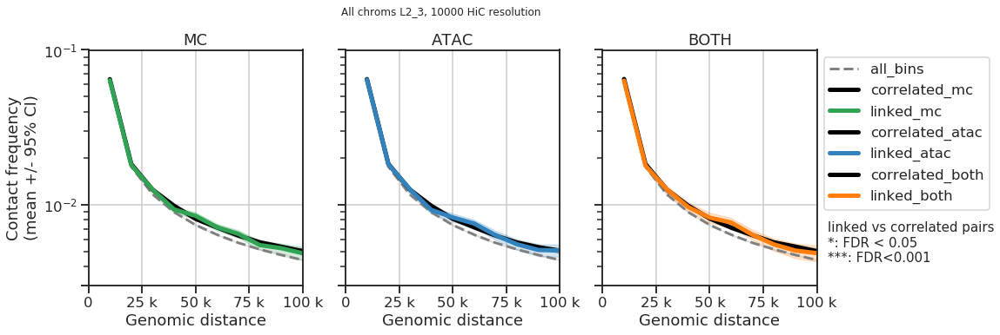

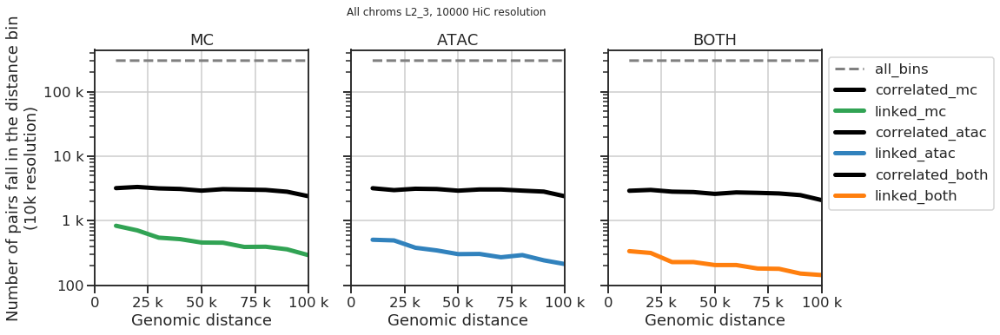

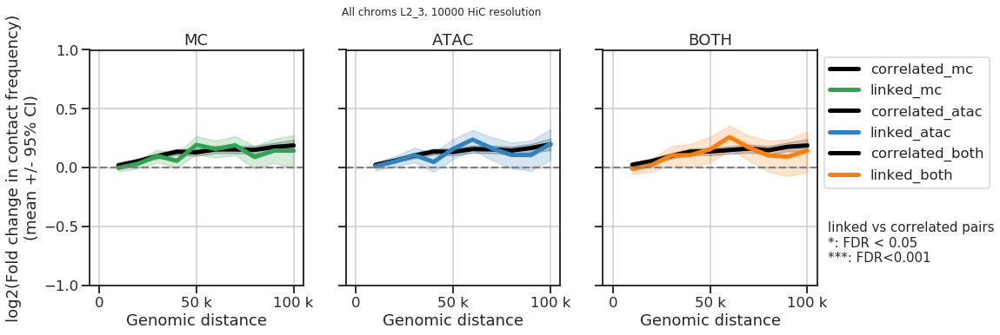

In [16]:
output_fig = output_fig_format.format("{}_{}_plot1_v3".format(celltype, resolution))
plot1_v3(distances, celltype, resolution, 
         track_names, 
         contacts_mean, contacts_std, contacts_n, 
         contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
         padjs_correlated,
         output_fig,
         )

output_fig = output_fig_format.format("{}_{}_plot1_v3_cov_test".format(celltype, resolution))
plot1_v3_cov(distances, celltype, resolution, 
         track_names, 
         contacts_mean, contacts_std, contacts_n, 
         contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
         output_fig,
         )

output_fig = output_fig_format.format("{}_{}_plot1_v4_test".format(celltype, resolution))
plot1_v4(distances, celltype, resolution, 
         track_names, 
         contacts_mean, contacts_std, contacts_n, 
         contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
         padjs_correlated,
         output_fig,
          ylim=[-1, 1],
          yticks=[-1, -0.5, 0, 0.5, 1],
         )

# all cell types

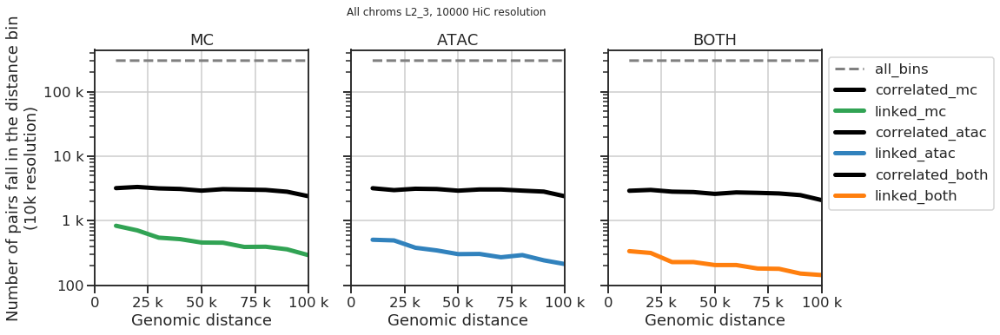

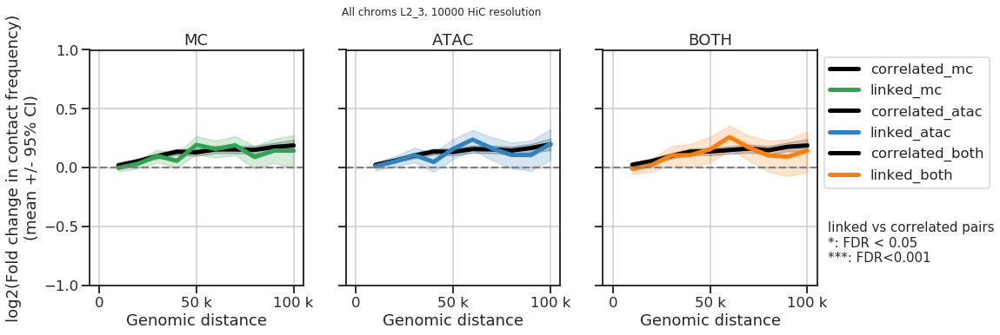

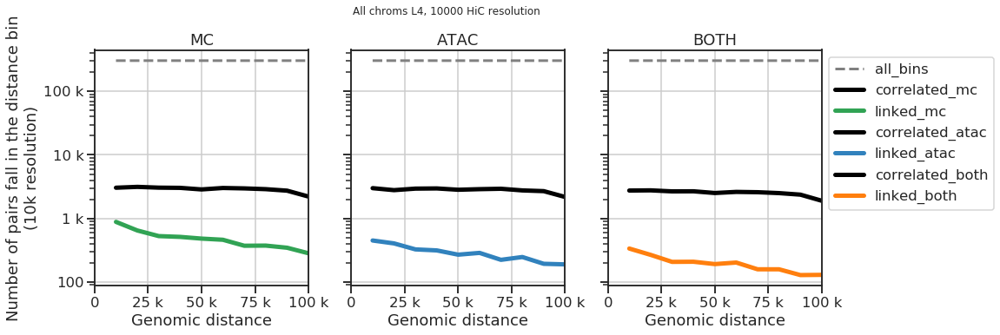

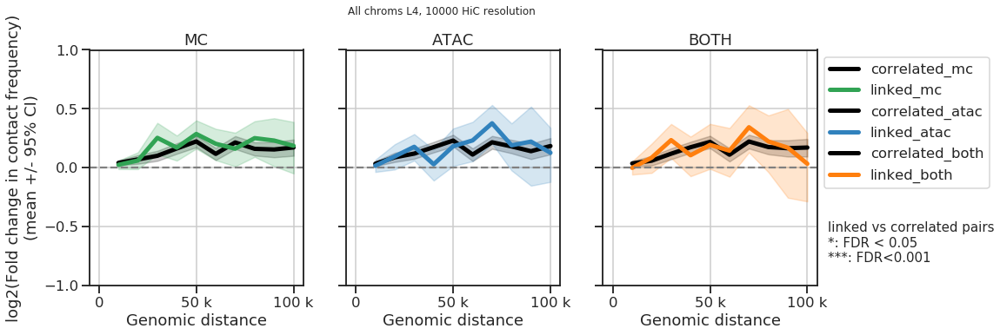

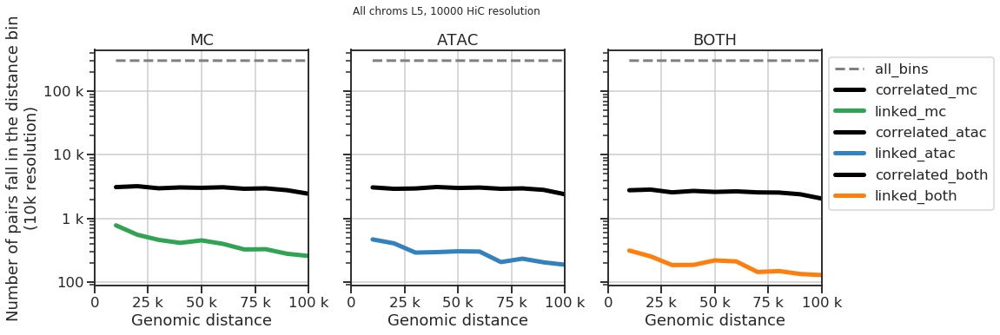

...

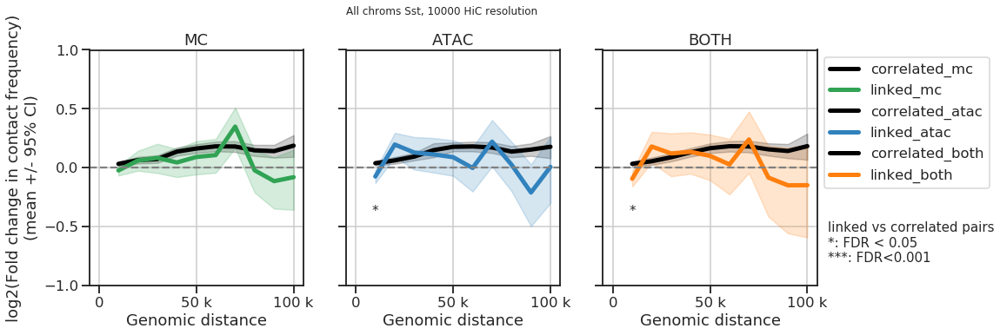

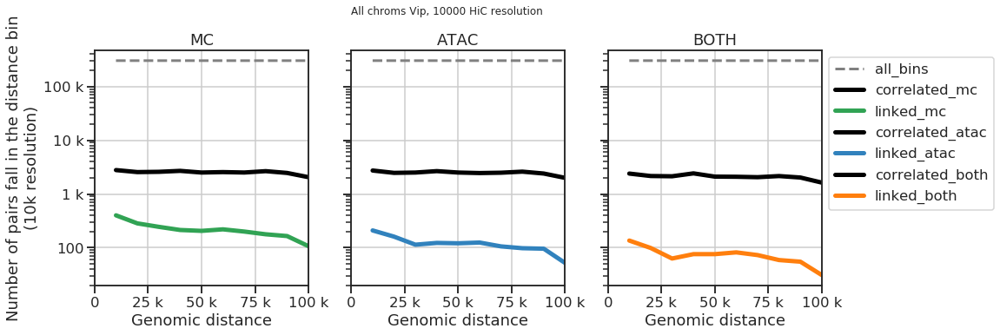

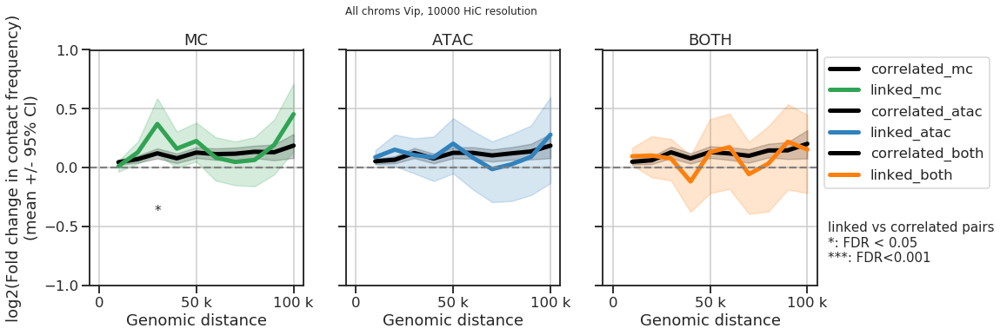

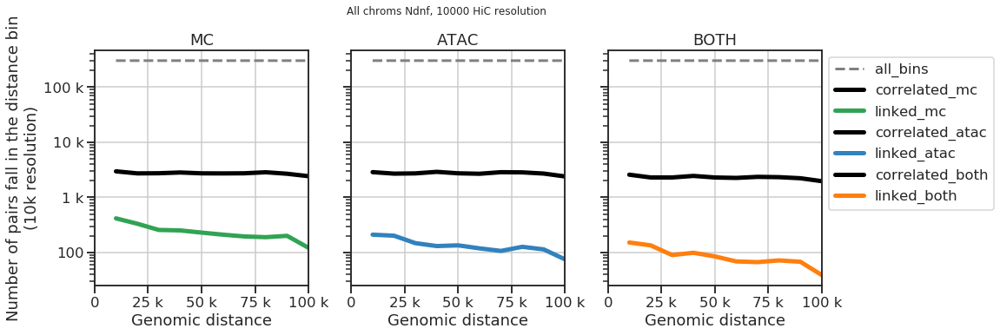

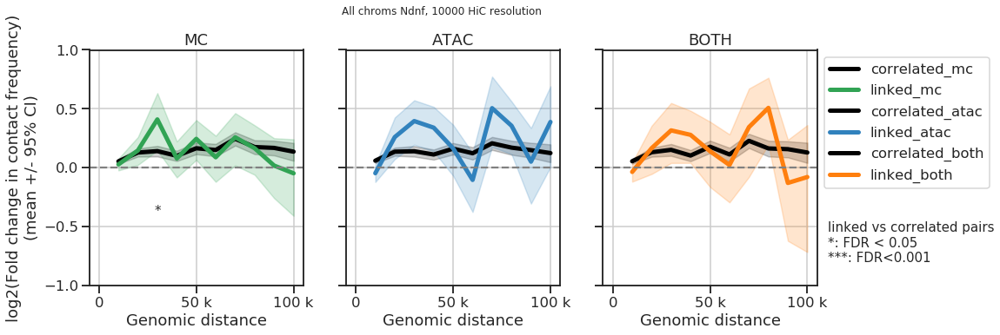

In [17]:
for celltype in celltypes:
    input_res = input_res_format.format(active_th, celltype, resolution, date)
    
    # get 
    with open(input_res, 'rb') as fh:
        (distances, 
         contacts_mean, contacts_std, contacts_n,
         contacts_sig_pairs_mean, 
         contacts_sig_pairs_std, 
         contacts_sig_pairs_n, 
        ) = pickle.load(fh)

    p_th1 = 0.05
    p_th2 = 0.001

    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean, contacts_std, contacts_n, 
                                                              contacts_sig_pairs_mean,
                                                              contacts_sig_pairs_std,
                                                              contacts_sig_pairs_n,
                                                              p_th1=p_th1, p_th2=p_th2)
    
    output_fig = output_fig_format.format("{}_{}_plot1_v3_cov_test".format(celltype, resolution))
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )

    output_fig = output_fig_format.format("{}_{}_plot1_v4_test".format(celltype, resolution))
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             padjs_correlated,
             output_fig,
              ylim=[-1, 1],
              yticks=[-1, -0.5, 0, 0.5, 1],
             )

# Summary 1: all celltypes

In [18]:
mean_fcs_bck_all = []
mean_fcs_correlated_all = []
padjs_bck_all = []
padjs_correlated_all = []

for celltype in celltypes:
    #
    input_res = input_res_format.format(active_th, celltype, resolution, date)

    # get 
    with open(input_res, 'rb') as fh:
        (distances, 
         contacts_mean, contacts_std, contacts_n,
         contacts_sig_pairs_mean, 
         contacts_sig_pairs_std, 
         contacts_sig_pairs_n, 
        ) = pickle.load(fh)

    p_th1 = 0.05
    p_th2 = 0.001

    # vs background
    mean_fcs_bck = collections.OrderedDict()
    padjs_bck = collections.OrderedDict()
    for key, item in contacts_sig_pairs_mean.items():
        # mean FC
        mean_fcs_bck[key] = item/contacts_mean

        # significance t-test
        t, p = stats.ttest_ind_from_stats(contacts_mean, contacts_std, contacts_n, 
                                          contacts_sig_pairs_mean[key],
                                          contacts_sig_pairs_std[key],
                                          contacts_sig_pairs_n[key],
                                          equal_var=True)
        # multiple comparison 
        _, padj, _, _ = multipletests(p, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)

        # 
        padjs_bck[key] = padj

    # vs correlated
    mean_fcs_correlated = collections.OrderedDict()
    padjs_correlated = collections.OrderedDict()
    for key, item in contacts_sig_pairs_mean.items():
        if key.startswith('linked_'):
            # mean FC
            key_matched = key.replace('linked_', 'correlated_') 
            mean_fcs_correlated[key] = item/contacts_sig_pairs_mean[key_matched]

            # significance t-test
            t, p = stats.ttest_ind_from_stats( 
                                              contacts_sig_pairs_mean[key_matched],
                                              contacts_sig_pairs_std[key_matched],
                                              contacts_sig_pairs_n[key_matched],
                                              contacts_sig_pairs_mean[key],
                                              contacts_sig_pairs_std[key],
                                              contacts_sig_pairs_n[key],
                                              equal_var=True)
            # multiple comparison 
            _, padj, _, _ = multipletests(p, alpha=0.05, method='hs', is_sorted=False, returnsorted=False)

            # 
            padjs_correlated[key] = padj
    
    # ...
    
    mean_fcs_bck_all.append({'celltype': celltype, 'mean_fc': mean_fcs_bck,})
    mean_fcs_correlated_all.append({'celltype': celltype, 'mean_fc': mean_fcs_correlated,})
    padjs_bck_all.append({'celltype': celltype, 'mean_fc': padjs_bck,})
    padjs_correlated_all.append({'celltype': celltype, 'mean_fc': padjs_correlated,})
    
mean_fcs_bck_all = pd.DataFrame(mean_fcs_bck_all)
print(mean_fcs_bck_all.shape)

mean_fcs_correlated_all = pd.DataFrame(mean_fcs_correlated_all)
print(mean_fcs_correlated_all.shape)

padjs_bck_all = pd.DataFrame(padjs_bck_all)
print(padjs_bck_all.shape)

padjs_correlated_all = pd.DataFrame(padjs_correlated_all)
print(padjs_correlated_all.shape)
mean_fcs_bck_all.head()

(8, 2)
(8, 2)
(8, 2)
(8, 2)


,celltype,mean_fc
0,L2_3,"{'linked_mc': [0.999501977287, 1.02405624026, ..."
1,L4,"{'linked_mc': [1.01799654223, 1.04395297608, 1..."
2,L5,"{'linked_mc': [1.00330619178, 1.04739853498, 1..."
3,L6,"{'linked_mc': [1.05160462478, 1.02684721945, 1..."
4,Pvalb,"{'linked_mc': [1.06446760043, 1.15479829642, 1..."


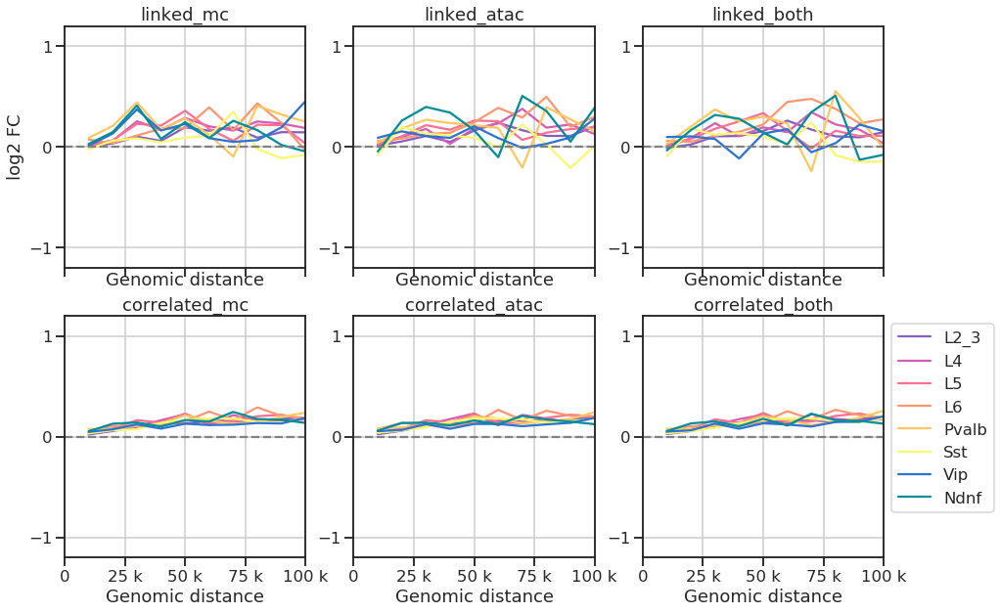

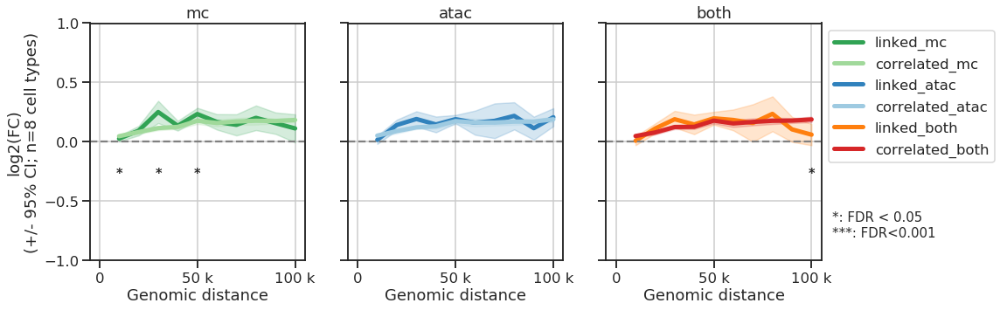

In [19]:
output_fig = output_fig_format.format("summarized_FC")
p_th = 0.05
plot2(distances, track_names, mean_fcs_bck_all, 
      celltype_palette, 
      output_fig, 
      ylim=[-1.2, 1.2],
      yticks=[-1, 0, 1],
     )

output_fig = output_fig_format.format("summarized_FC_v2")
plot3(distances, mean_fcs_bck_all, 
      track_names, padjs_bck_all,
      output_fig, 
      ylim=[-1, 1],
      yticks=[-1, -0.5, 0, 0.5, 1],
     )

# Summary 2: combine all cell types into 1 track

- reconcile 8 different (mean, std, n)

In [20]:
# combine all cell types

contacts_mean_all = []
contacts_std_all = []
contacts_n_all = []

contacts_sig_pairs_mean_all = {track: [] for track in track_names}
contacts_sig_pairs_std_all = {track: [] for track in track_names}
contacts_sig_pairs_n_all = {track: [] for track in track_names}


for celltype in celltypes:
    input_res = input_res_format.format(active_th, celltype, resolution, date)
    
    # get 
    with open(input_res, 'rb') as fh:
        (distances, 
         contacts_mean, contacts_std, contacts_n,
         contacts_sig_pairs_mean, 
         contacts_sig_pairs_std, 
         contacts_sig_pairs_n, 
        ) = pickle.load(fh)

    # contacts: by regions -> celltype by regions -> by regions
    contacts_mean_all.append(contacts_mean)
    contacts_std_all.append(contacts_std)
    contacts_n_all.append(contacts_n)
    
    # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
    for key in contacts_sig_pairs_mean.keys():
        contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
        contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
        contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])
    
# celltype by region 
contacts_mean_all = np.array(contacts_mean_all)
contacts_std_all = np.array(contacts_std_all)
contacts_n_all = np.array(contacts_n_all)
for key in contacts_sig_pairs_mean_all.keys():
    contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
    contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
    contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

# by region
(contacts_mean_agg, contacts_std_agg, contacts_n_agg,
) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)
 
# key by region
contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
contacts_sig_pairs_std_agg = {track: [] for track in track_names}
contacts_sig_pairs_n_agg = {track: [] for track in track_names}
for key in contacts_sig_pairs_mean_all.keys():
    (contacts_sig_pairs_mean_agg[key], 
     contacts_sig_pairs_std_agg[key], 
     contacts_sig_pairs_n_agg[key], 
    ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                  contacts_sig_pairs_std_all[key], 
                                  contacts_sig_pairs_n_all[key], 
                                 )
    
p_th1 = 0.05
p_th2 = 0.001
(mean_fcs_bck, padjs_bck, 
 mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                         contacts_std_agg, 
                                                         contacts_n_agg, 
                                                         contacts_sig_pairs_mean_agg,
                                                         contacts_sig_pairs_std_agg,
                                                         contacts_sig_pairs_n_agg,
                                                         p_th1=p_th1, p_th2=p_th2)

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


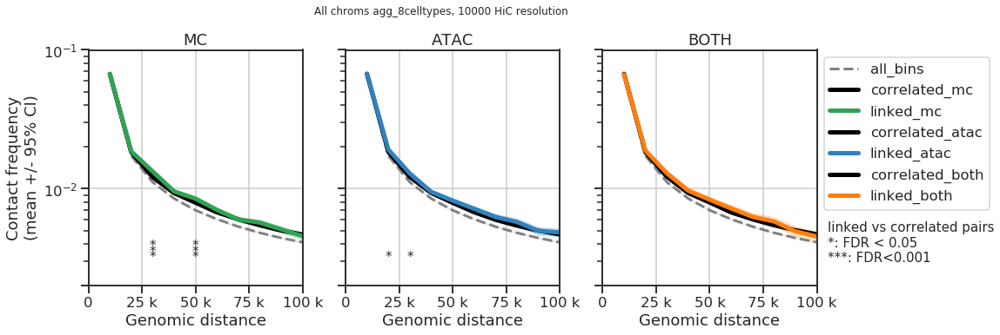

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


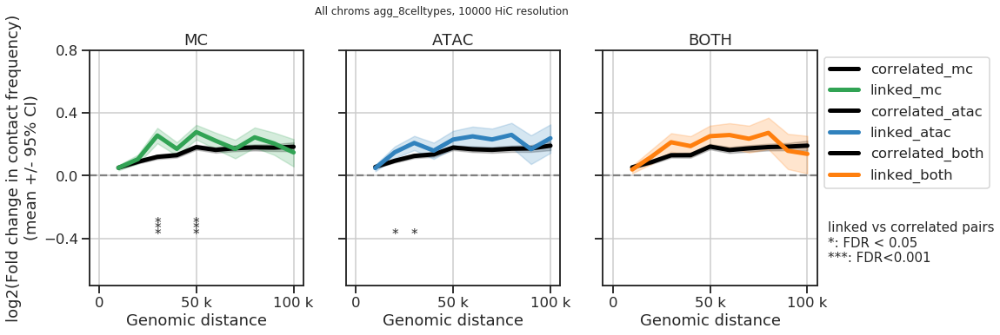

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


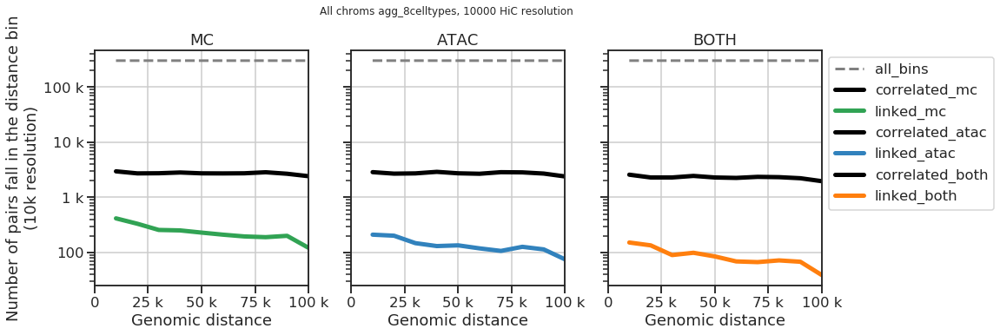

In [21]:
celltype = 'agg_8celltypes'

output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
print(output_fig)
plot1_v3(distances, celltype, resolution, 
         track_names,
         contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
         contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
         padjs_correlated,
         output_fig,
         ylim=[2e-3, 1e-1],
         yticks=[2e-3, 1e-2, 1e-1,],
         )

output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
print(output_fig)
plot1_v4(distances, celltype, resolution, 
         track_names, 
         contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
         contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
         padjs_correlated,
         output_fig,
         ylim=[-0.7, 0.8],
         yticks=[-0.4, 0, 0.4, 0.8],
         )

output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
print(output_fig)
plot1_v3_cov(distances, celltype, resolution, 
         track_names, 
         contacts_mean, contacts_std, contacts_n, 
         contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
         output_fig,
         )

# apply summary 2 to all thresholds


In [23]:
resolution = 10000
active_th = 50
date = '2020-12-15'

min_matches = np.arange(0.1, 1+0.05, 0.05)
print(min_matches)

[ 0.1   0.15  0.2   0.25  0.3   0.35  0.4   0.45  0.5   0.55  0.6   0.65
  0.7   0.75  0.8   0.85  0.9   0.95  1.  ]


0.1
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.10_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


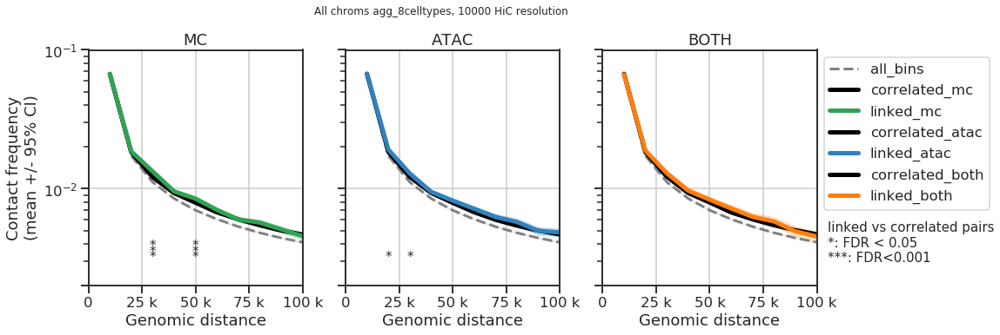

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


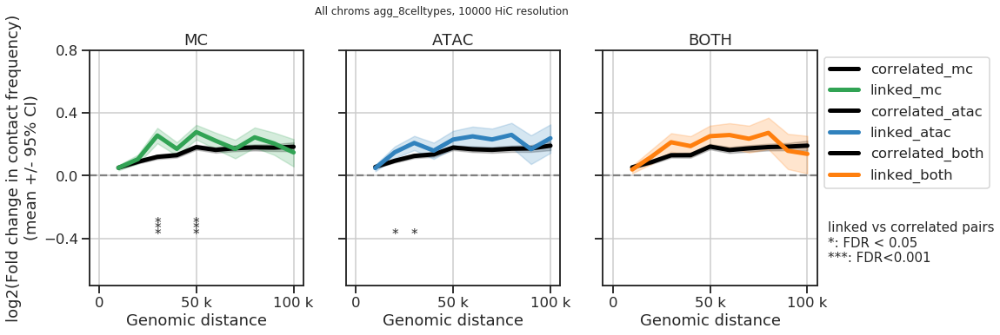

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


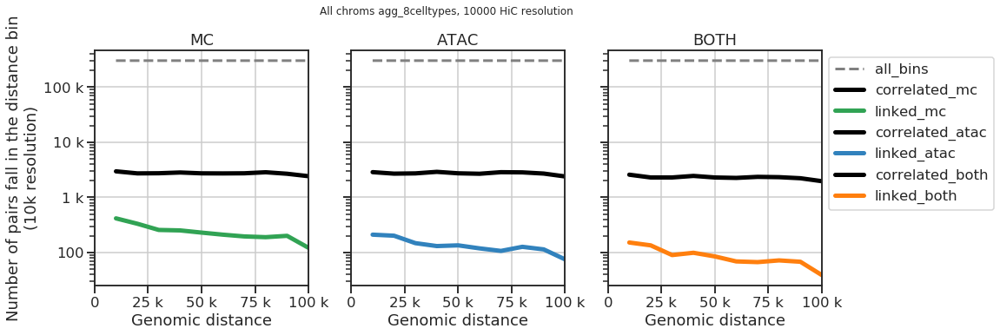

0.15
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.15_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


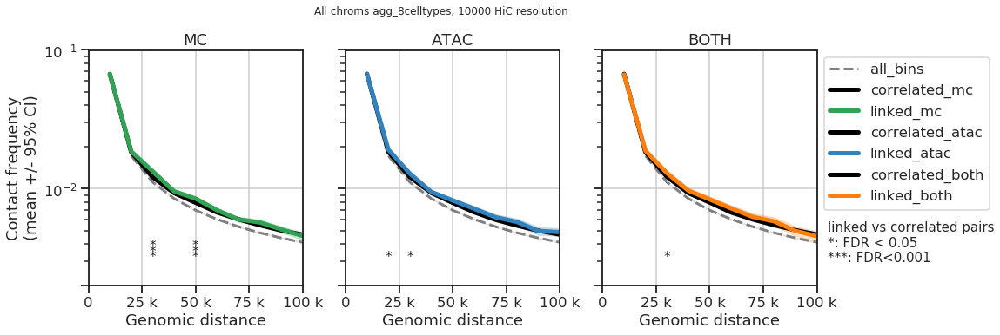

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


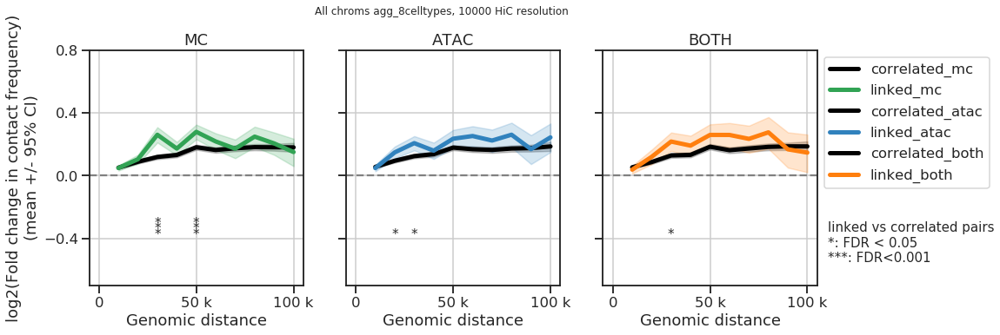

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


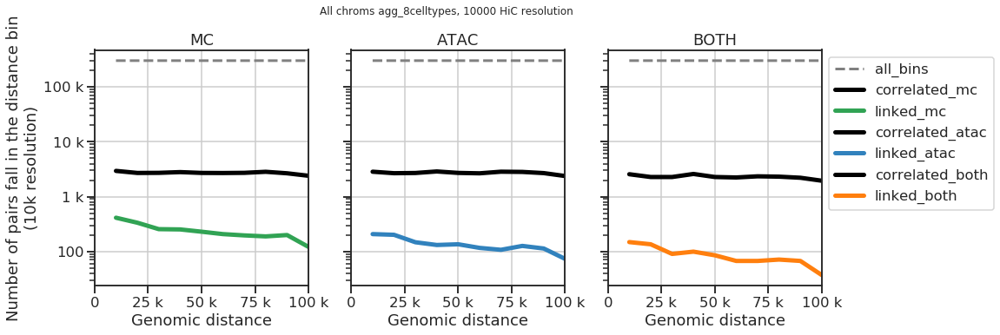

0.2
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.20_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


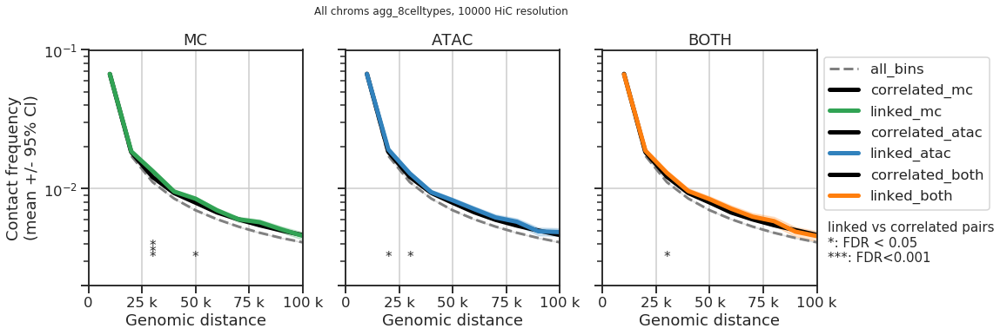

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


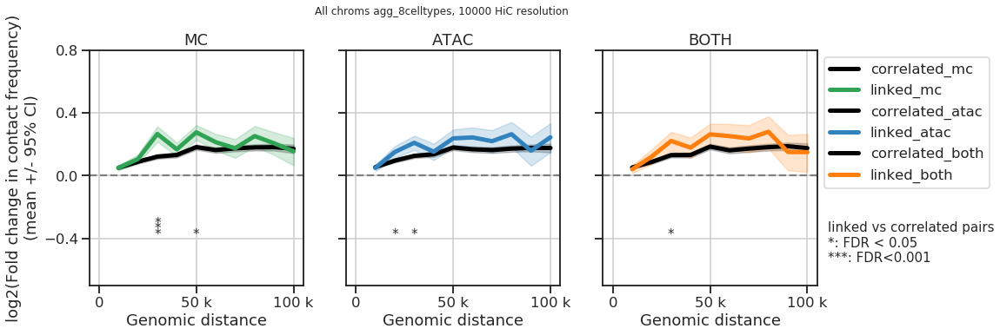

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


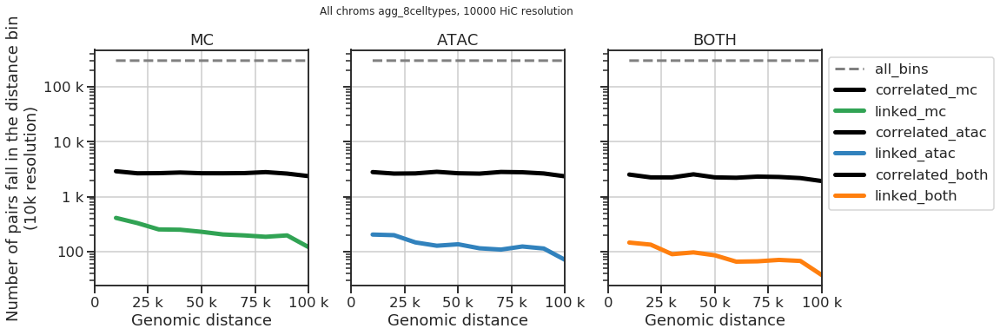

0.25
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.25_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


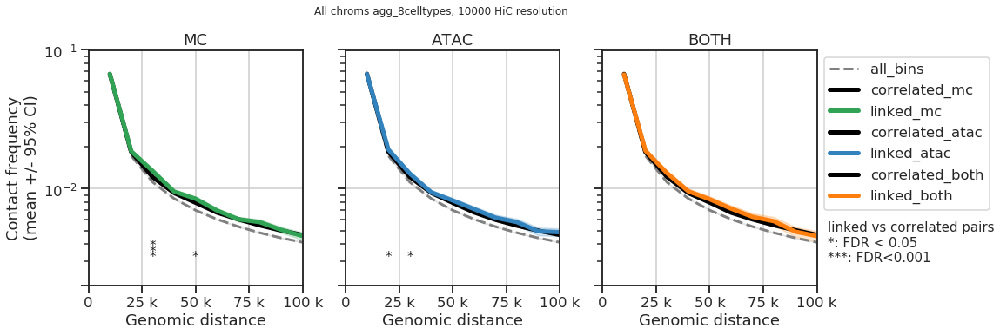

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


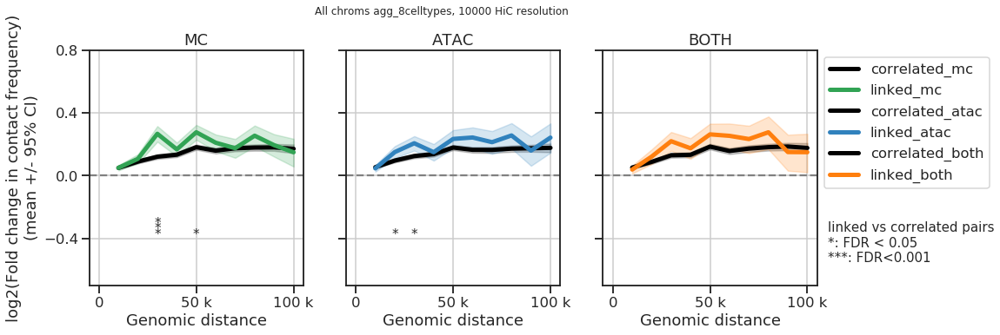

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


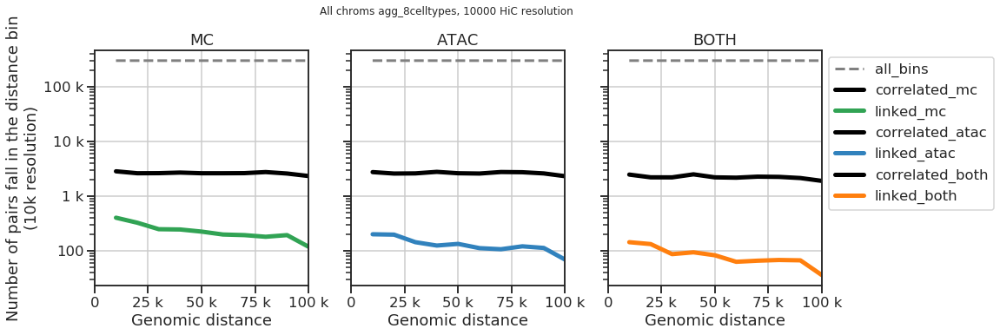

0.3
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.30_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


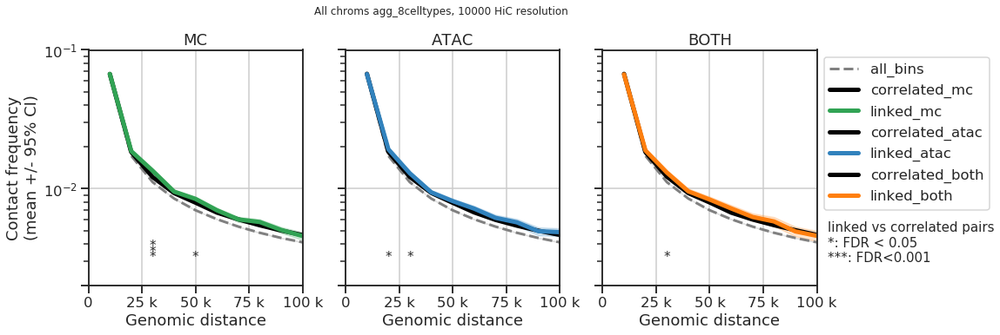

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


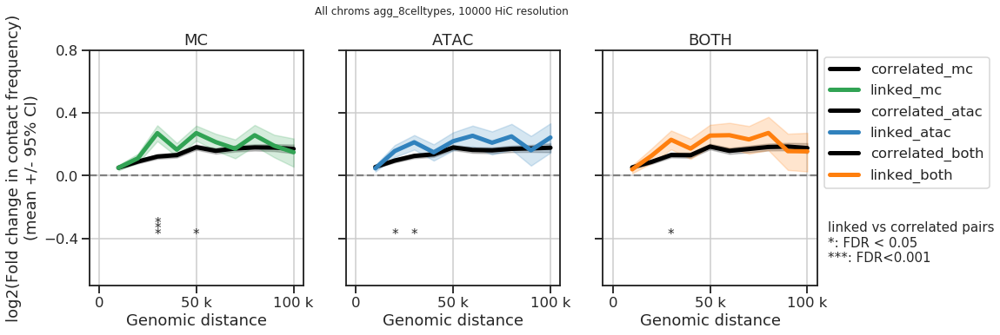

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


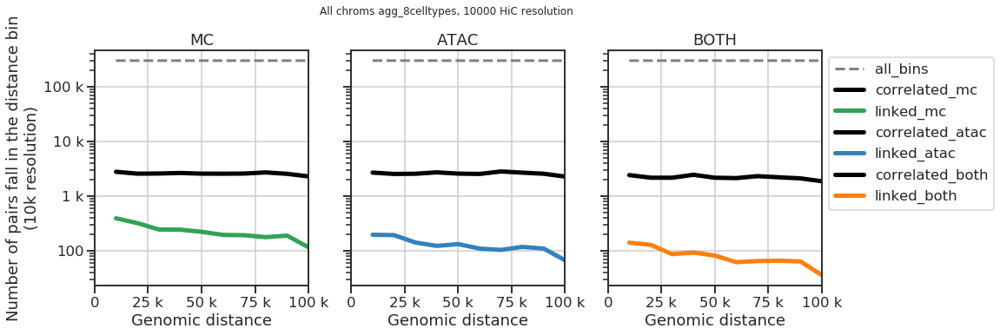

0.35
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.35_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


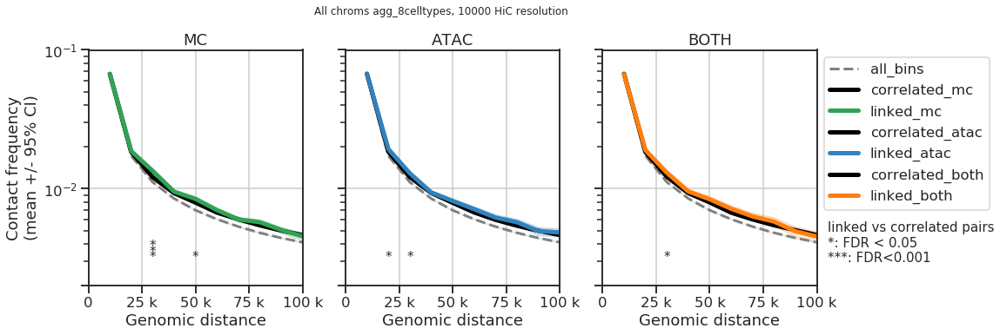

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


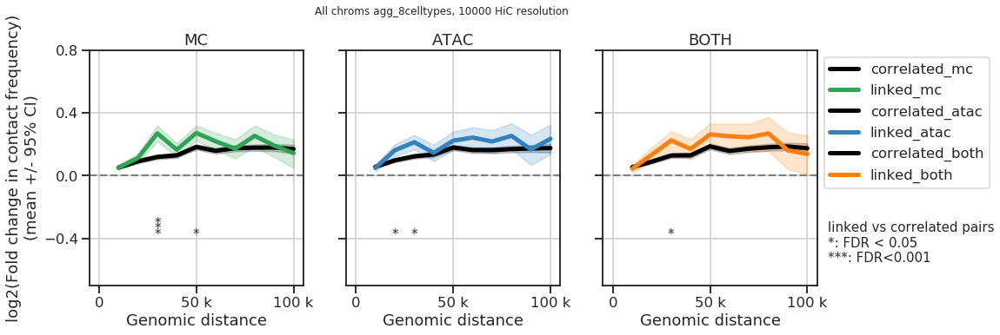

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


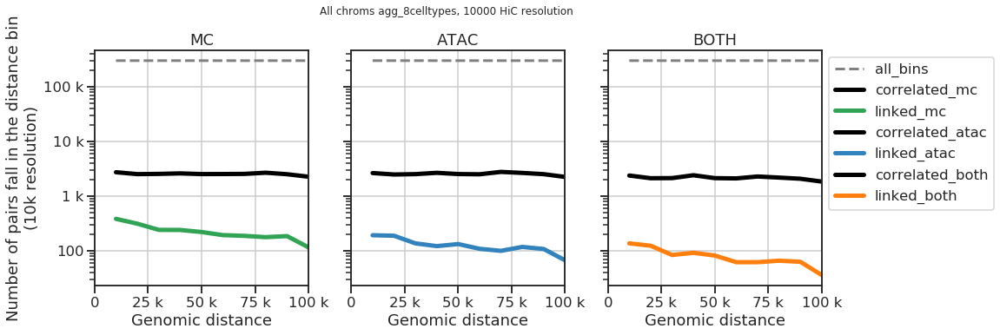

0.4
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.40_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


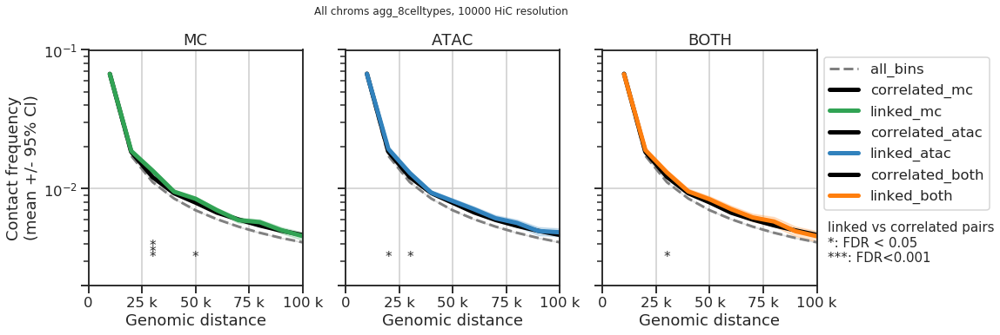

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


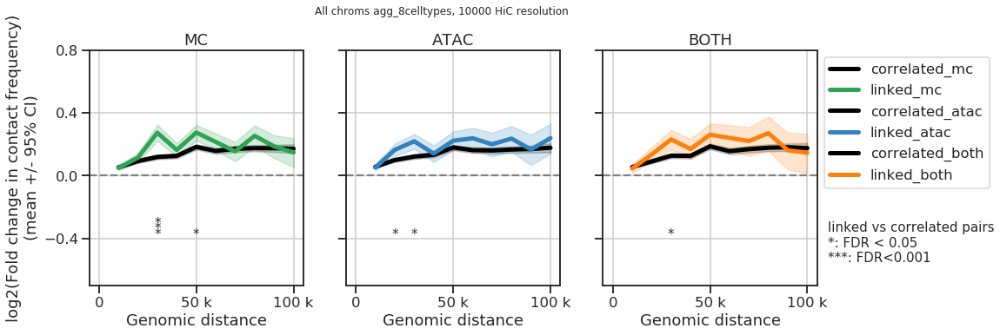

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


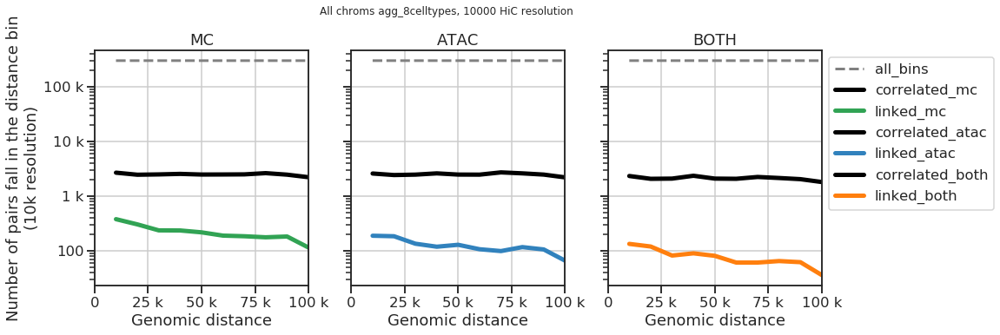

0.45
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.45_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


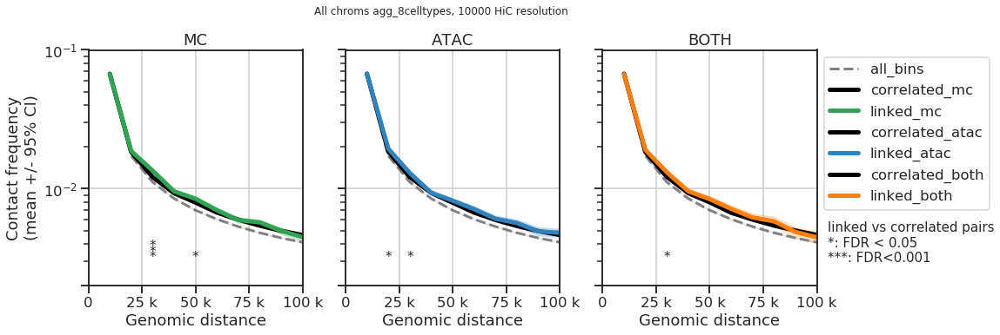

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


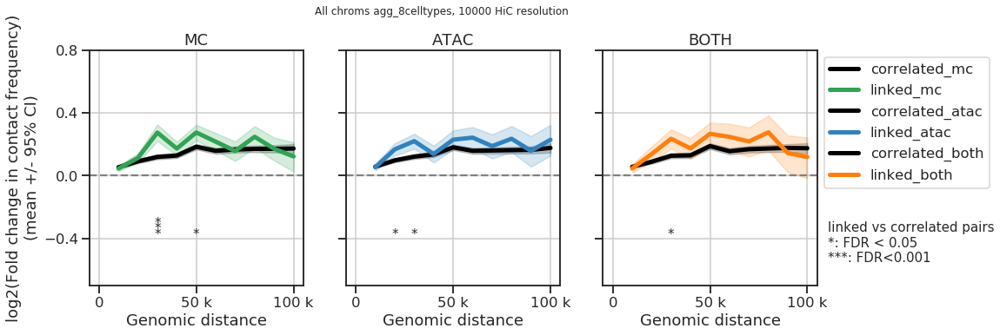

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


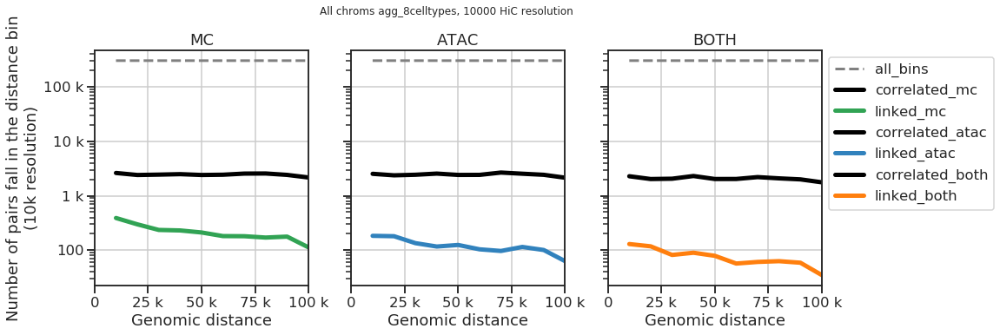

0.5
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.50_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


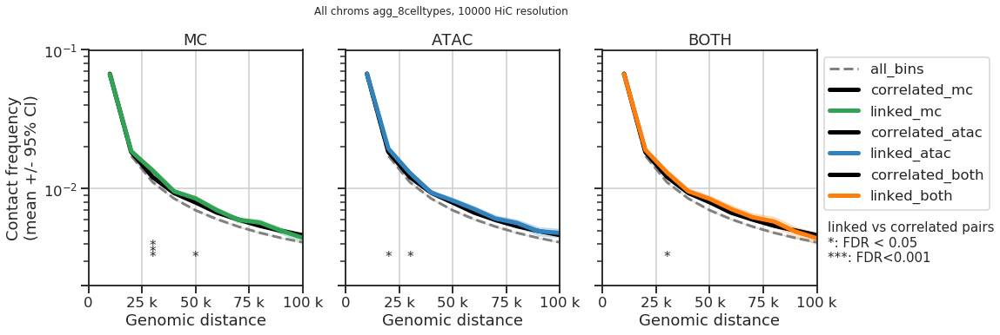

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


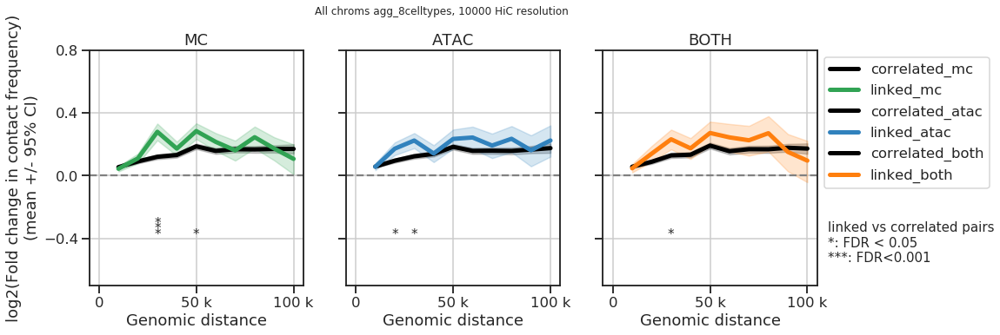

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


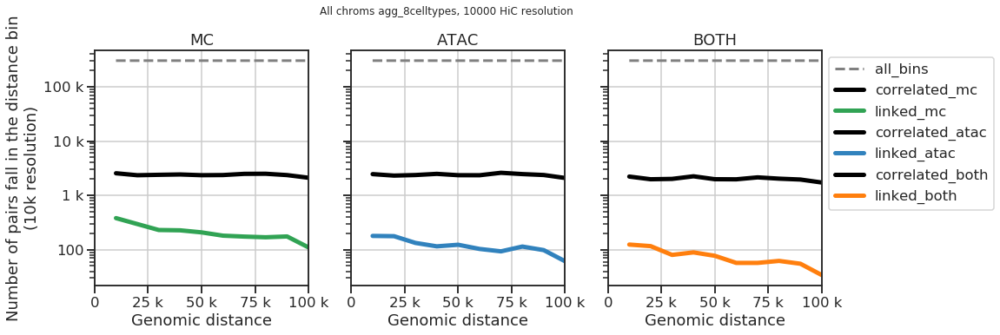

0.55
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.55_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


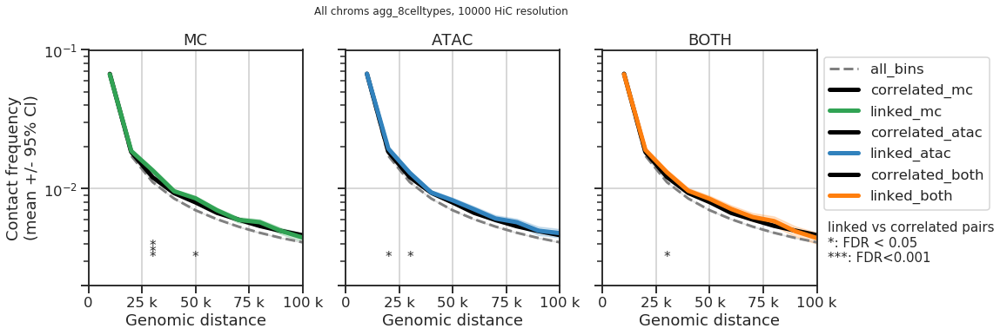

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


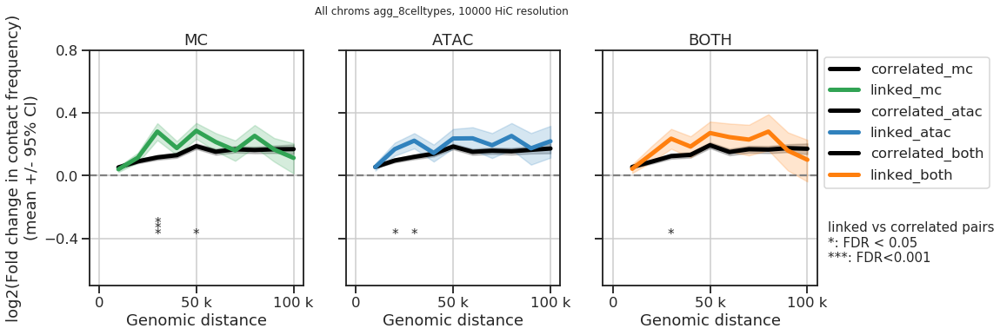

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


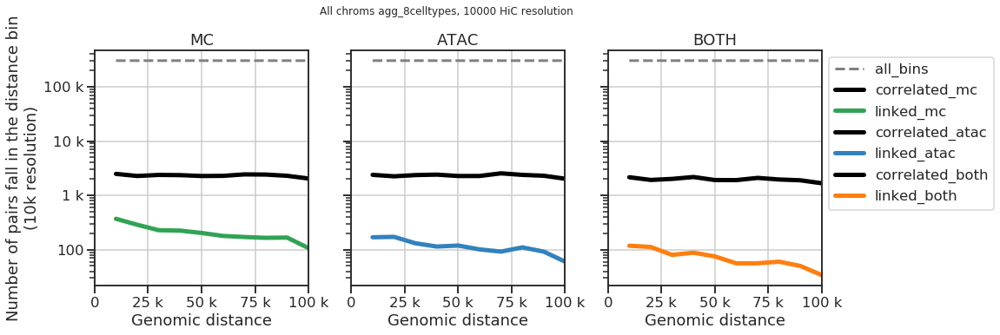

0.6
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.60_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


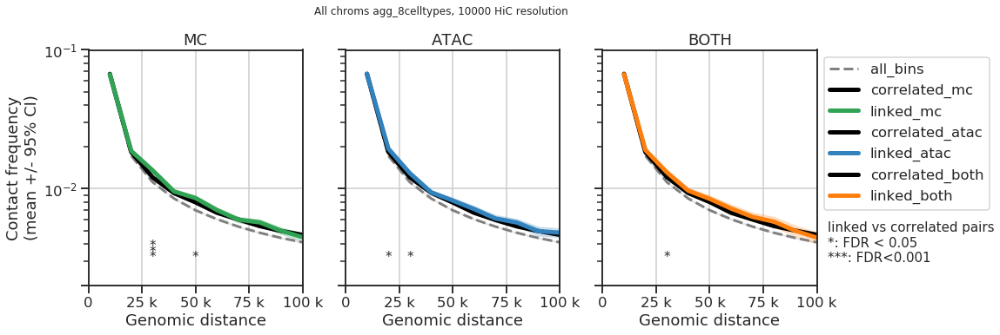

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


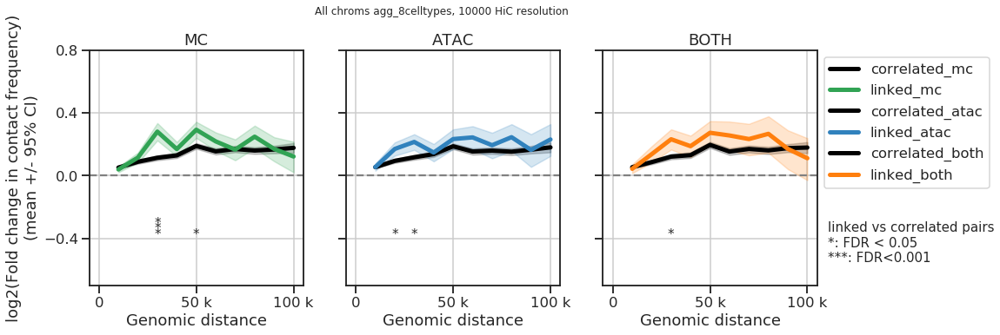

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


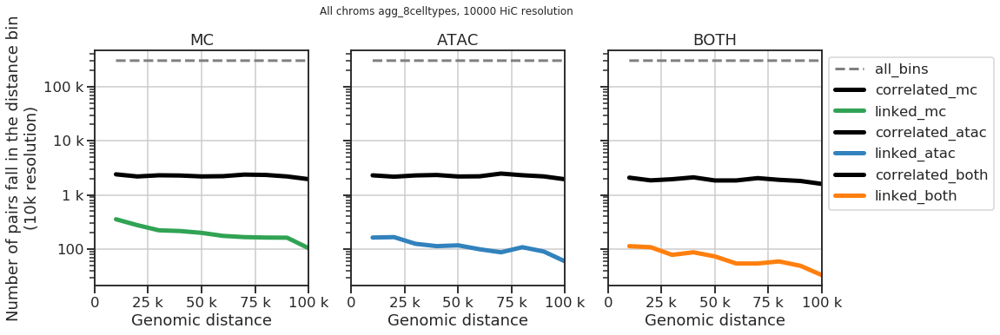

0.65
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.65_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


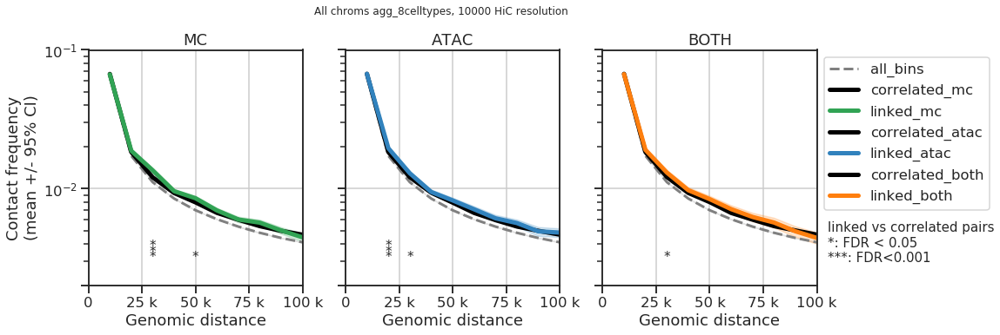

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


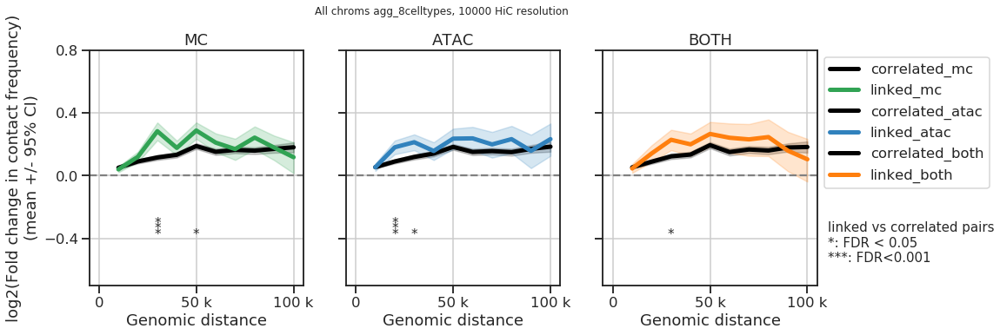

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


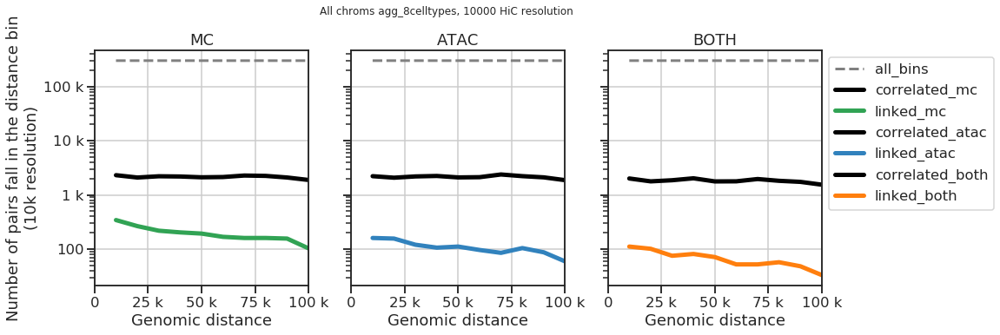

0.7
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.70_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


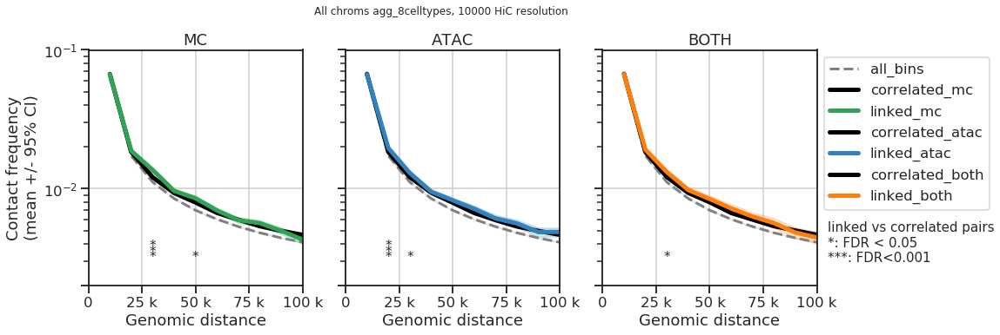

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


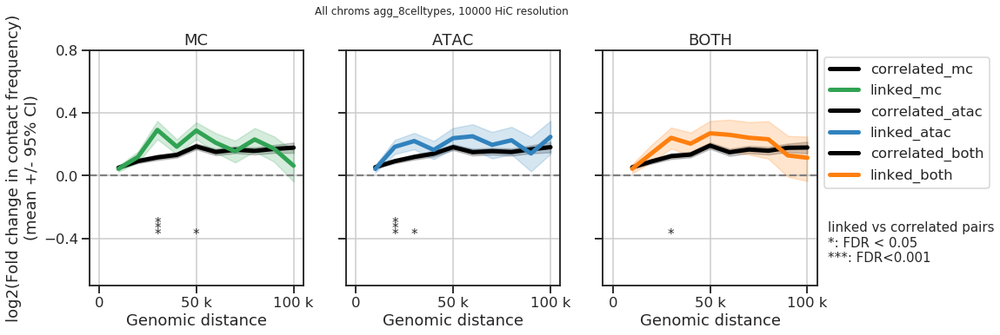

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


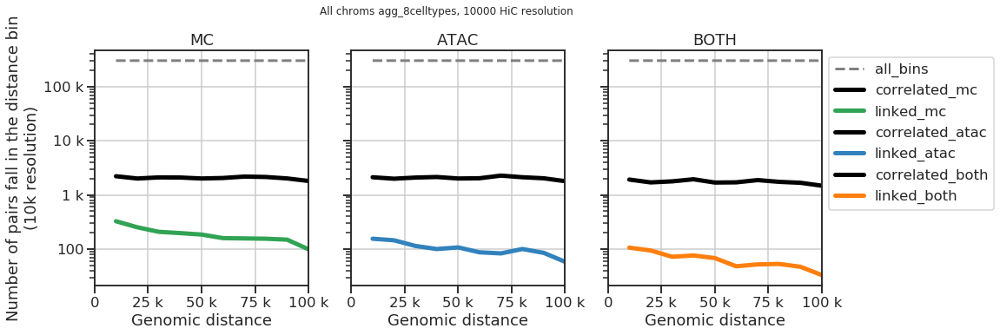

0.75
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.75_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


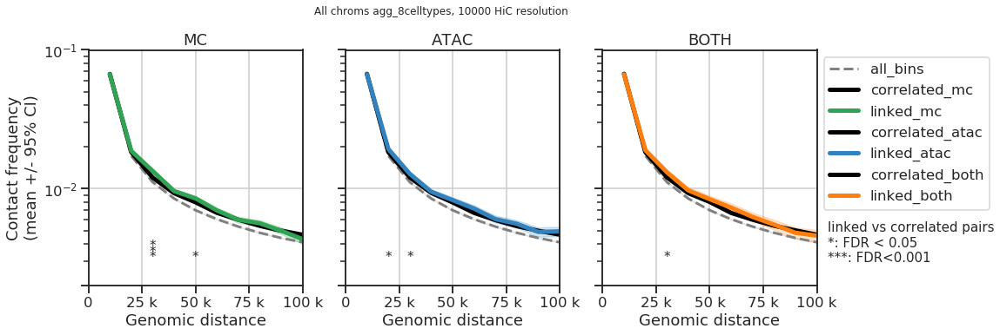

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


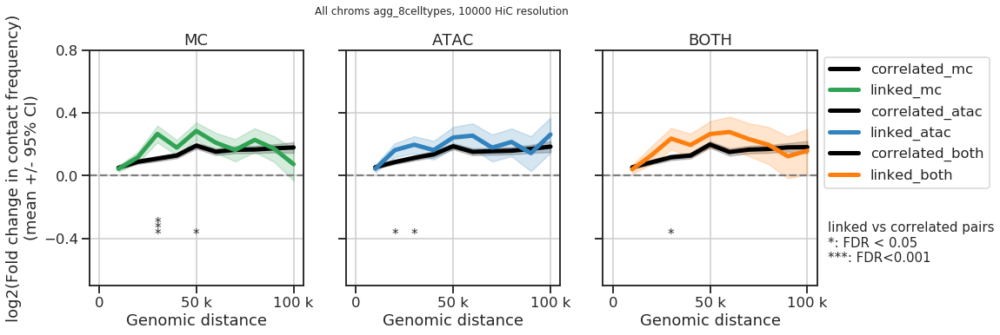

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


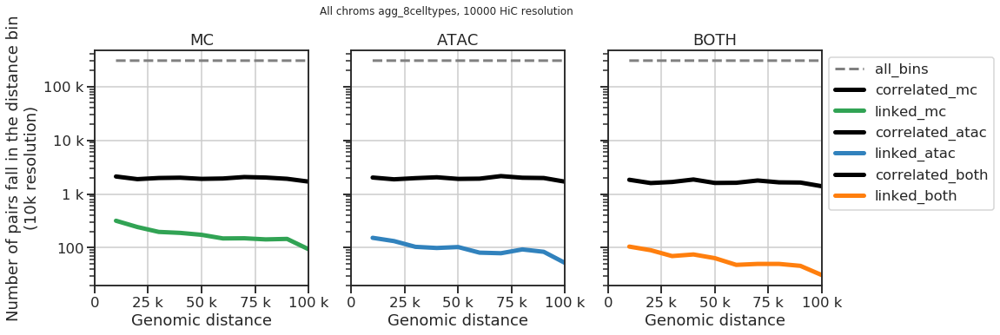

0.8
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


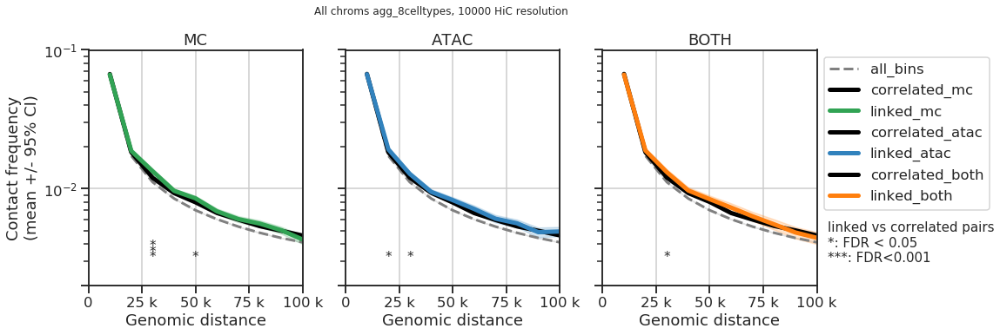

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


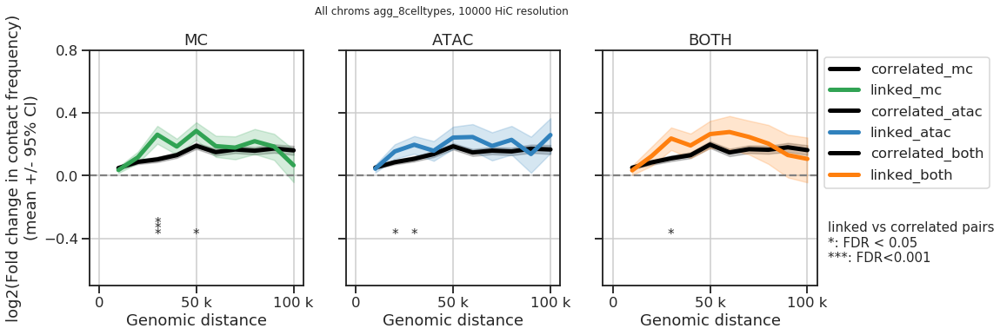

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


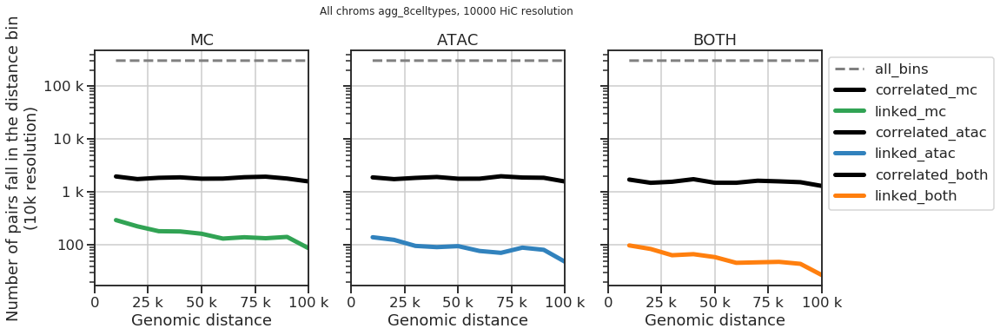

0.85
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.85_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


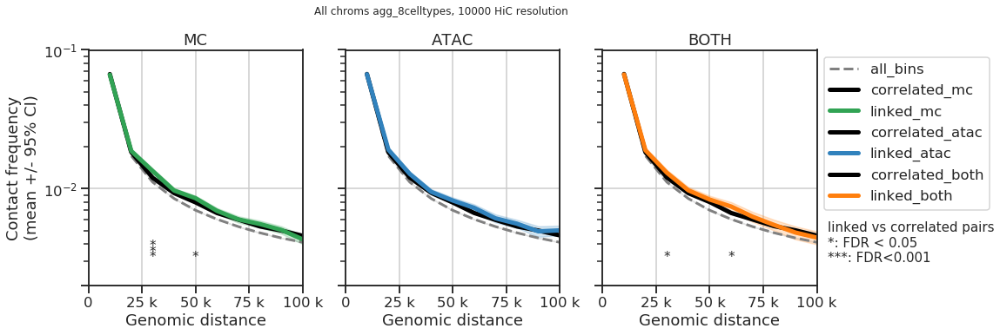

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


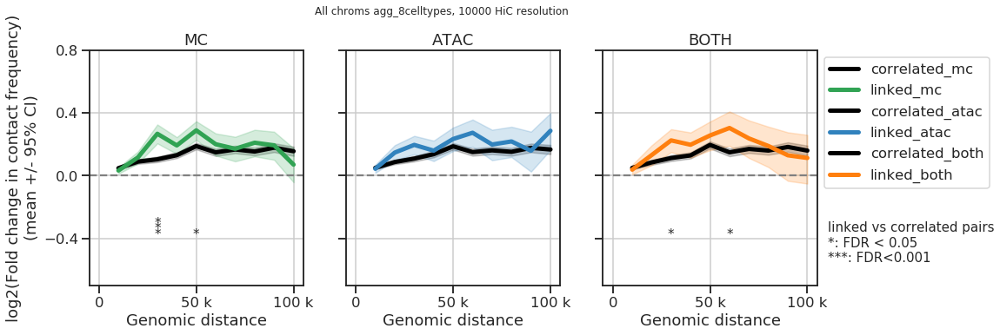

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


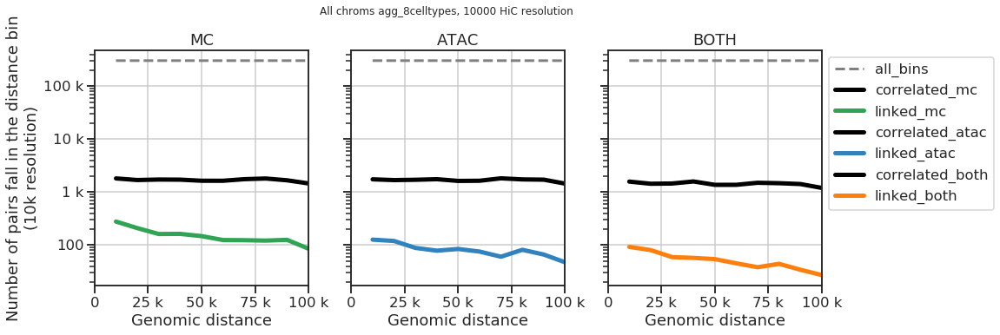

0.9
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.90_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


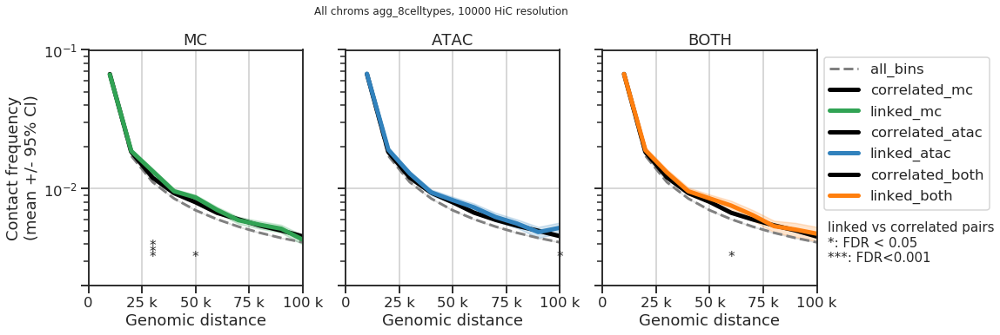

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


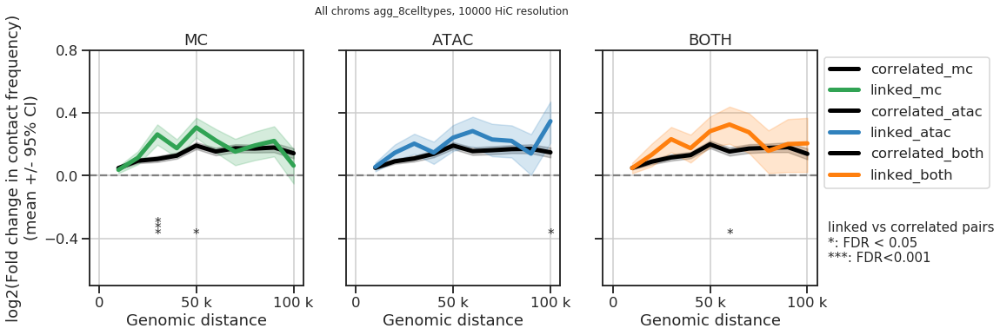

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


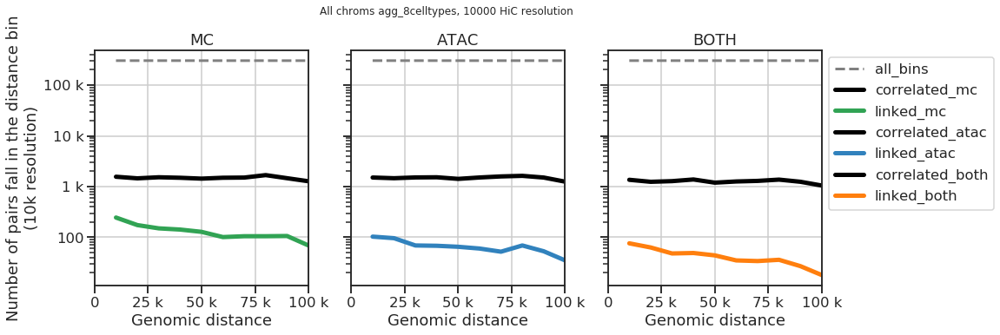

0.95
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.95_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


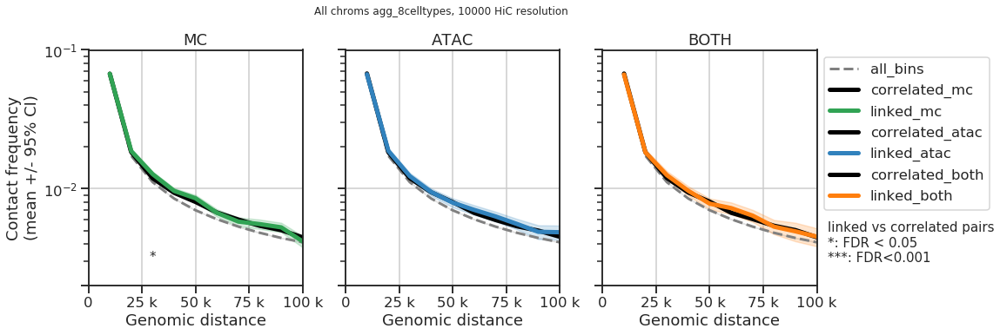

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


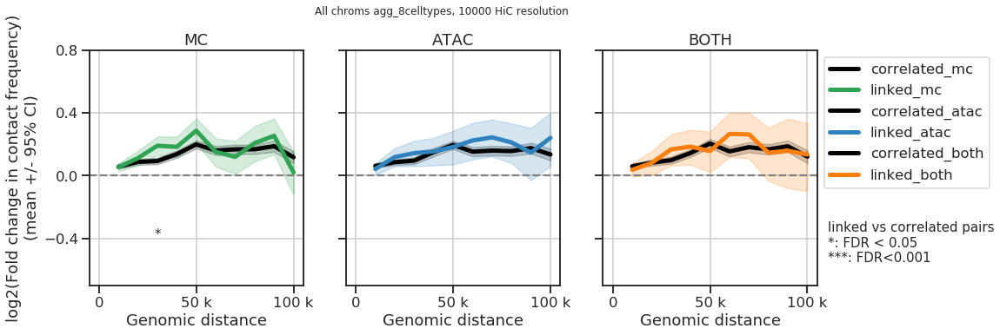

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


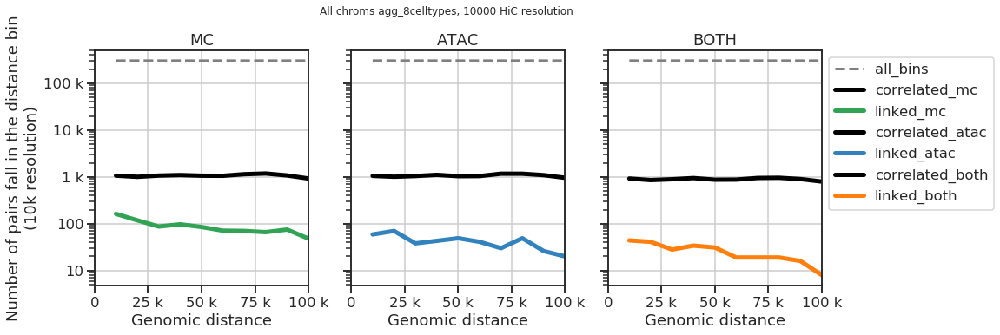

1.0
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover1.00_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_{}.pdf


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/scipy/stats/stats.py:3960: RuntimeWarning: divide by zero encountered in true_divide
  denom = np.sqrt(svar * (1.0 / n1 + 1.0 / n2))


/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


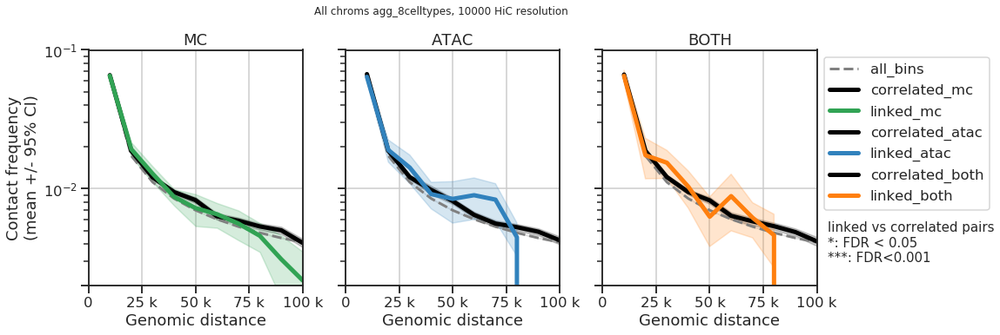

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in log2


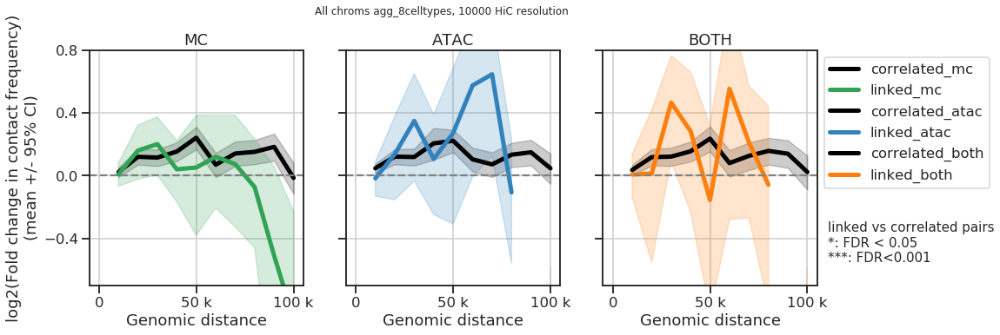

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


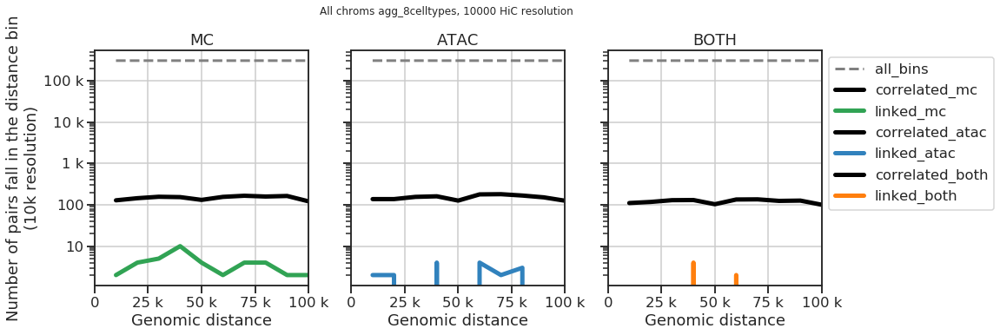

In [25]:


for min_match in min_matches:
    print(min_match)
    input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
                  .format(min_match)
                 )
    print(input_res_format)

    output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                         'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                         .format(min_match)
                        )
    print(output_fig_format)

    # combine all cell types

    contacts_mean_all = []
    contacts_std_all = []
    contacts_n_all = []

    contacts_sig_pairs_mean_all = {track: [] for track in track_names}
    contacts_sig_pairs_std_all = {track: [] for track in track_names}
    contacts_sig_pairs_n_all = {track: [] for track in track_names}


    for celltype in celltypes:
        input_res = input_res_format.format(active_th, celltype, resolution, date)

        # get 
        with open(input_res, 'rb') as fh:
            (distances, 
             contacts_mean, contacts_std, contacts_n,
             contacts_sig_pairs_mean, 
             contacts_sig_pairs_std, 
             contacts_sig_pairs_n, 
            ) = pickle.load(fh)

        # contacts: by regions -> celltype by regions -> by regions
        contacts_mean_all.append(contacts_mean)
        contacts_std_all.append(contacts_std)
        contacts_n_all.append(contacts_n)

        # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
        for key in contacts_sig_pairs_mean.keys():
            contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
            contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
            contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])

    # celltype by region 
    contacts_mean_all = np.array(contacts_mean_all)
    contacts_std_all = np.array(contacts_std_all)
    contacts_n_all = np.array(contacts_n_all)
    for key in contacts_sig_pairs_mean_all.keys():
        contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
        contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
        contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

    # by region
    (contacts_mean_agg, contacts_std_agg, contacts_n_agg,
    ) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)

    # key by region
    contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
    contacts_sig_pairs_std_agg = {track: [] for track in track_names}
    contacts_sig_pairs_n_agg = {track: [] for track in track_names}
    for key in contacts_sig_pairs_mean_all.keys():
        (contacts_sig_pairs_mean_agg[key], 
         contacts_sig_pairs_std_agg[key], 
         contacts_sig_pairs_n_agg[key], 
        ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                      contacts_sig_pairs_std_all[key], 
                                      contacts_sig_pairs_n_all[key], 
                                     )

    p_th1 = 0.05
    p_th2 = 0.001
    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                             contacts_std_agg, 
                                                             contacts_n_agg, 
                                                             contacts_sig_pairs_mean_agg,
                                                             contacts_sig_pairs_std_agg,
                                                             contacts_sig_pairs_n_agg,
                                                             p_th1=p_th1, p_th2=p_th2)
    
    # plot
    celltype = 'agg_8celltypes'
    output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3(distances, celltype, resolution, 
             track_names,
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[2e-3, 1e-1],
             yticks=[2e-3, 1e-2, 1e-1,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[-0.7, 0.8],
             yticks=[-0.4, 0, 0.4, 0.8],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )

# improve on summary 2 
- compare with correlated but not linked


[0.8]
0.8
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


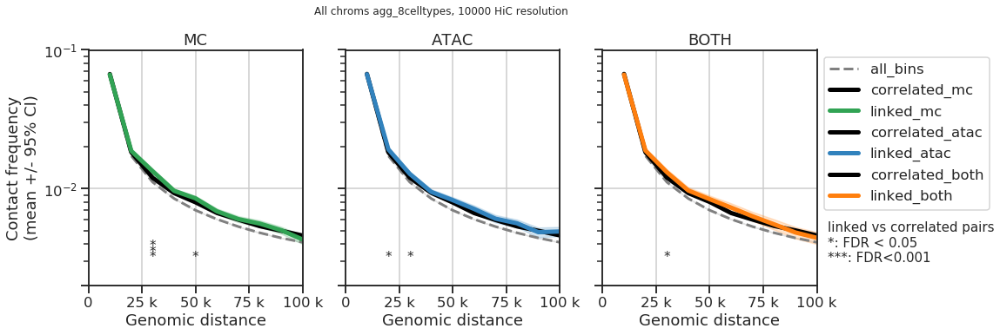

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


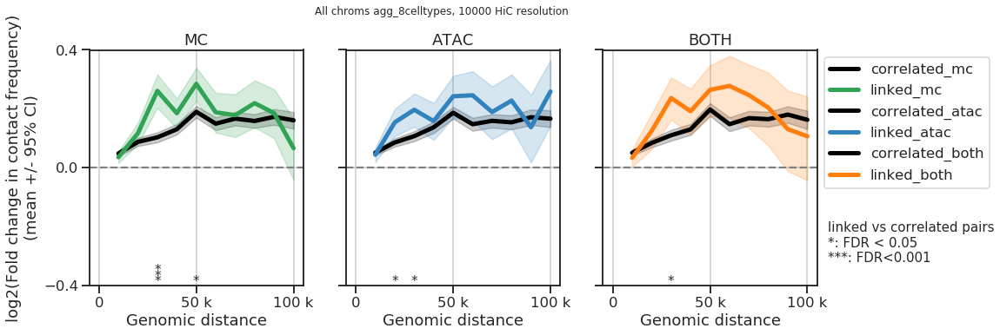

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


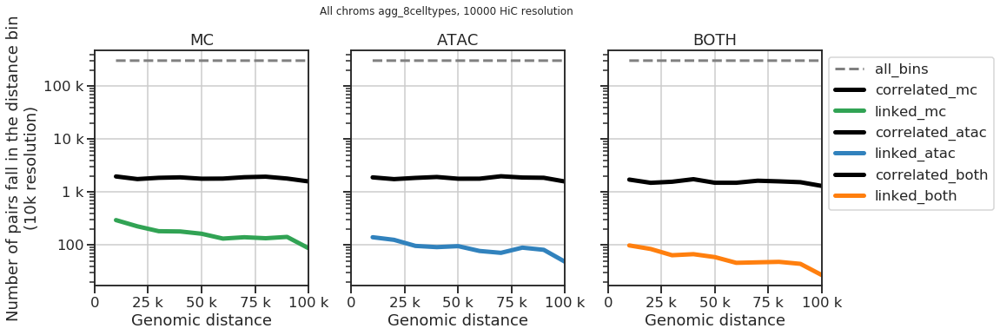

In [40]:
# 

resolution = 10000
active_th = 50
date = '2020-12-15'

# min_matches = np.arange(0.1, 1+0.05, 0.05)
min_matches = [0.80]
print(min_matches)

for min_match in min_matches:
    print(min_match)
    input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
                  .format(min_match)
                 )
    print(input_res_format)

    output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                         'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                         .format(min_match)
                        )
    print(output_fig_format)

    # combine all cell types

    contacts_mean_all = []
    contacts_std_all = []
    contacts_n_all = []

    contacts_sig_pairs_mean_all = {track: [] for track in track_names}
    contacts_sig_pairs_std_all = {track: [] for track in track_names}
    contacts_sig_pairs_n_all = {track: [] for track in track_names}


    for celltype in celltypes:
        input_res = input_res_format.format(active_th, celltype, resolution, date)

        # get 
        with open(input_res, 'rb') as fh:
            (distances, 
             contacts_mean, contacts_std, contacts_n,
             contacts_sig_pairs_mean, 
             contacts_sig_pairs_std, 
             contacts_sig_pairs_n, 
            ) = pickle.load(fh)
        # contacts: by regions -> celltype by regions -> by regions
        contacts_mean_all.append(contacts_mean)
        contacts_std_all.append(contacts_std)
        contacts_n_all.append(contacts_n)

        # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
        for key in contacts_sig_pairs_mean.keys():
            contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
            contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
            contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])

    # celltype by region 
    contacts_mean_all = np.array(contacts_mean_all)
    contacts_std_all = np.array(contacts_std_all)
    contacts_n_all = np.array(contacts_n_all)
    for key in contacts_sig_pairs_mean_all.keys():
        contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
        contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
        contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

    # by region
    (contacts_mean_agg, contacts_std_agg, contacts_n_agg,
    ) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)

    # key by region
    contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
    contacts_sig_pairs_std_agg = {track: [] for track in track_names}
    contacts_sig_pairs_n_agg = {track: [] for track in track_names}
    for key in contacts_sig_pairs_mean_all.keys():
        (contacts_sig_pairs_mean_agg[key], 
         contacts_sig_pairs_std_agg[key], 
         contacts_sig_pairs_n_agg[key], 
        ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                      contacts_sig_pairs_std_all[key], 
                                      contacts_sig_pairs_n_all[key], 
                                     )

    p_th1 = 0.05
    p_th2 = 0.001
    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                             contacts_std_agg, 
                                                             contacts_n_agg, 
                                                             contacts_sig_pairs_mean_agg,
                                                             contacts_sig_pairs_std_agg,
                                                             contacts_sig_pairs_n_agg,
                                                             p_th1=p_th1, p_th2=p_th2)
    
    # plot
    celltype = 'agg_8celltypes'
    output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3(distances, celltype, resolution, 
             track_names,
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[2e-3, 1e-1],
             yticks=[2e-3, 1e-2, 1e-1,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[-0.4, 0.4],
             yticks=[-0.4, 0, 0.4,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )

[0.8]
0.8
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


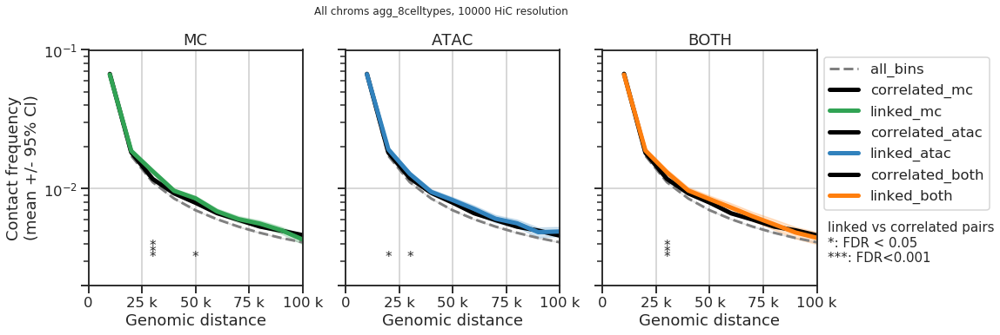

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


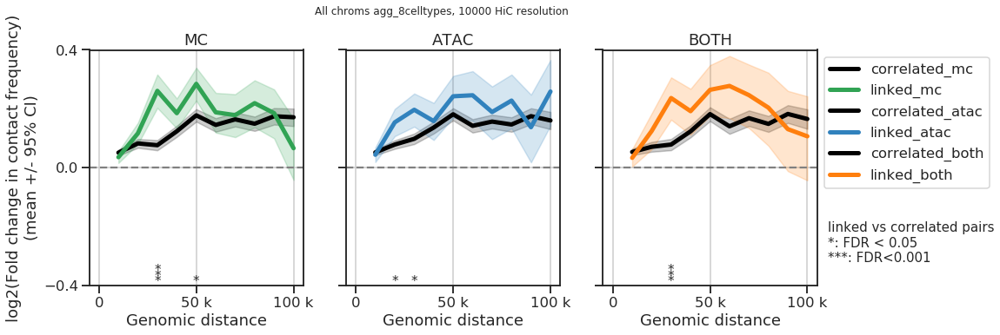

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


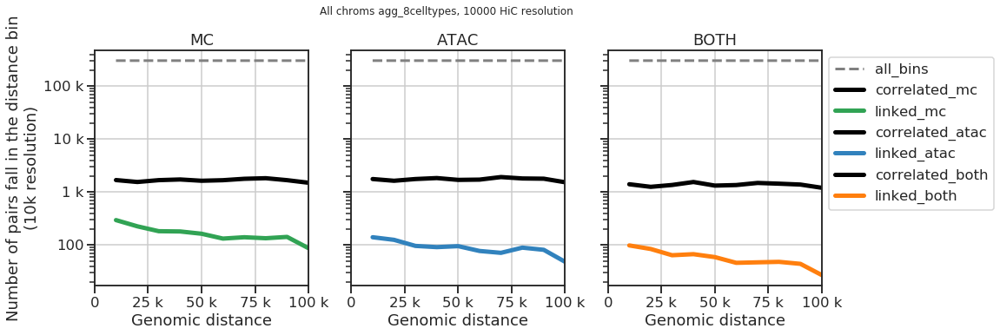

In [41]:
#

resolution = 10000
active_th = 50
date = '2020-12-17'

# min_matches = np.arange(0.1, 1+0.05, 0.05)
min_matches = [0.80]
print(min_matches)

for min_match in min_matches:
    print(min_match)
    input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
                  .format(min_match)
                 )
    print(input_res_format)

    output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                         'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                         .format(min_match)
                        )
    print(output_fig_format)

    # combine all cell types

    contacts_mean_all = []
    contacts_std_all = []
    contacts_n_all = []

    contacts_sig_pairs_mean_all = {track: [] for track in track_names}
    contacts_sig_pairs_std_all = {track: [] for track in track_names}
    contacts_sig_pairs_n_all = {track: [] for track in track_names}


    for celltype in celltypes:
        input_res = input_res_format.format(active_th, celltype, resolution, date)

        # get 
        with open(input_res, 'rb') as fh:
            (distances, 
             contacts_mean, contacts_std, contacts_n,
             contacts_sig_pairs_mean, 
             contacts_sig_pairs_std, 
             contacts_sig_pairs_n, 
            ) = pickle.load(fh)
        # contacts: by regions -> celltype by regions -> by regions
        contacts_mean_all.append(contacts_mean)
        contacts_std_all.append(contacts_std)
        contacts_n_all.append(contacts_n)

        # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
        for key in contacts_sig_pairs_mean.keys():
            contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
            contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
            contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])

    # celltype by region 
    contacts_mean_all = np.array(contacts_mean_all)
    contacts_std_all = np.array(contacts_std_all)
    contacts_n_all = np.array(contacts_n_all)
    for key in contacts_sig_pairs_mean_all.keys():
        contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
        contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
        contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

    # by region
    (contacts_mean_agg, contacts_std_agg, contacts_n_agg,
    ) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)

    # key by region
    contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
    contacts_sig_pairs_std_agg = {track: [] for track in track_names}
    contacts_sig_pairs_n_agg = {track: [] for track in track_names}
    for key in contacts_sig_pairs_mean_all.keys():
        (contacts_sig_pairs_mean_agg[key], 
         contacts_sig_pairs_std_agg[key], 
         contacts_sig_pairs_n_agg[key], 
        ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                      contacts_sig_pairs_std_all[key], 
                                      contacts_sig_pairs_n_all[key], 
                                     )

    p_th1 = 0.05
    p_th2 = 0.001
    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                             contacts_std_agg, 
                                                             contacts_n_agg, 
                                                             contacts_sig_pairs_mean_agg,
                                                             contacts_sig_pairs_std_agg,
                                                             contacts_sig_pairs_n_agg,
                                                             p_th1=p_th1, p_th2=p_th2)
    
    # plot
    celltype = 'agg_8celltypes'
    output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3(distances, celltype, resolution, 
             track_names,
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[2e-3, 1e-1],
             yticks=[2e-3, 1e-2, 1e-1,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[-0.4, 0.4],
             yticks=[-0.4, 0, 0.4,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )

# apply summary 2 to all thresholds


In [23]:
resolution = 10000
active_th = 50
date = '2020-12-15'

min_matches = np.arange(0.1, 1+0.05, 0.05)
print(min_matches)

[ 0.1   0.15  0.2   0.25  0.3   0.35  0.4   0.45  0.5   0.55  0.6   0.65
  0.7   0.75  0.8   0.85  0.9   0.95  1.  ]


0.1
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.10_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


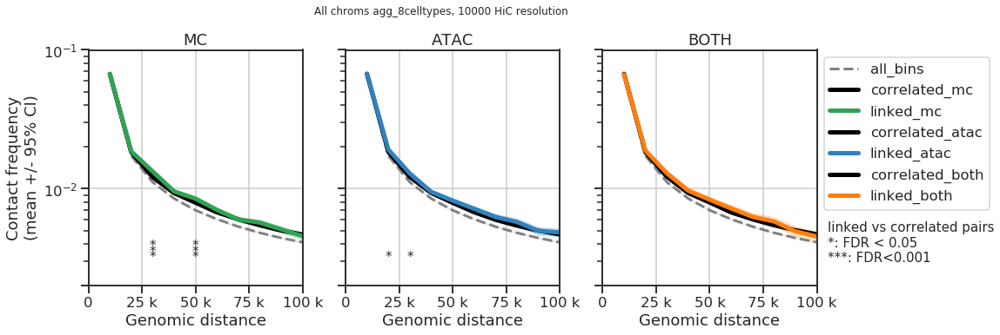

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


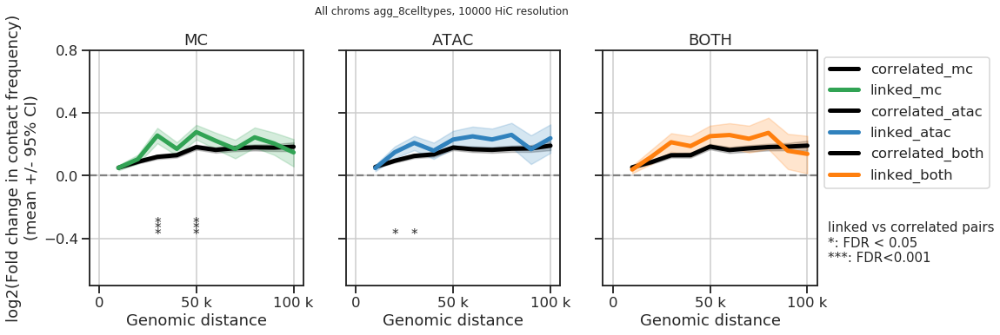

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.10_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


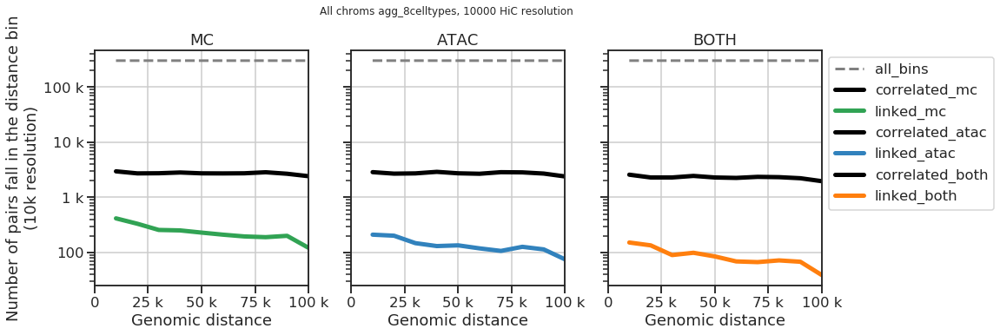

0.15
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.15_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


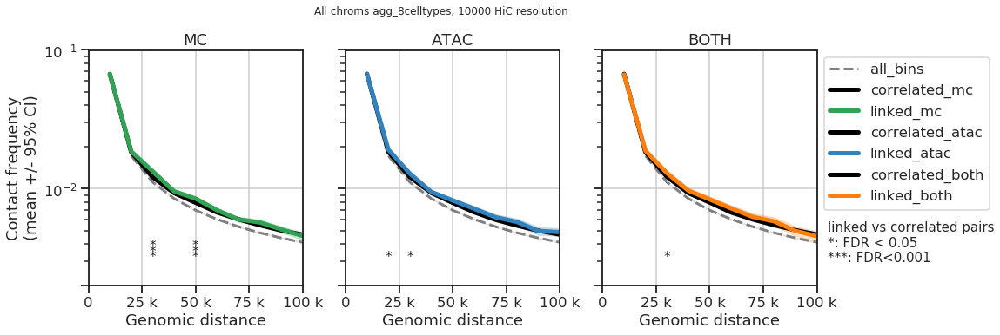

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


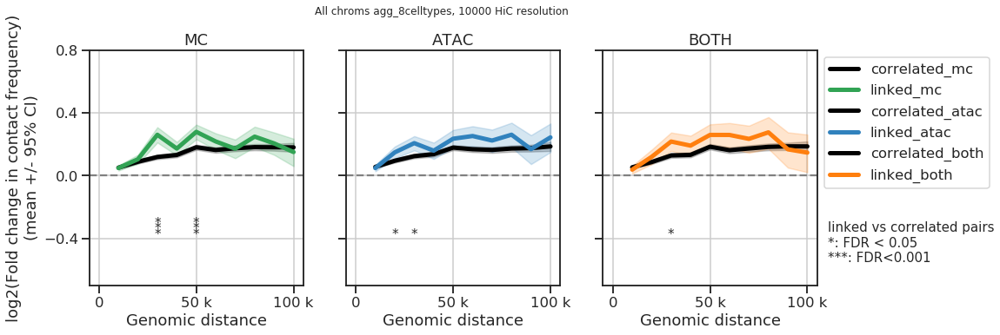

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.15_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


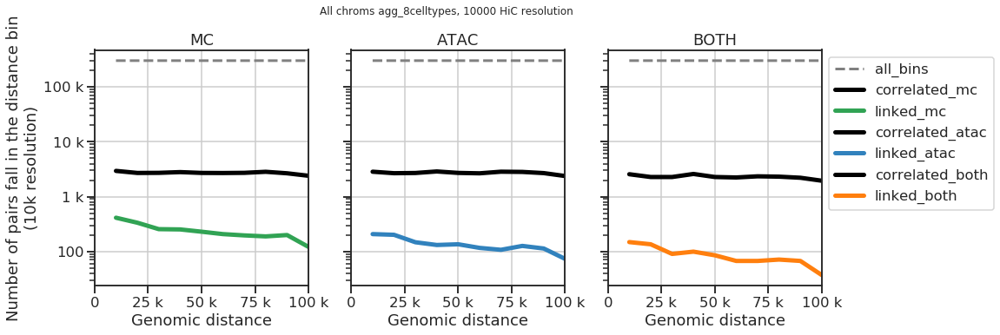

0.2
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.20_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


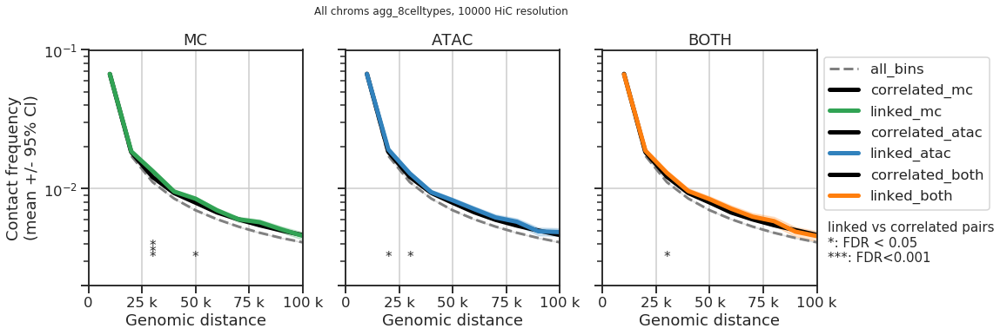

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


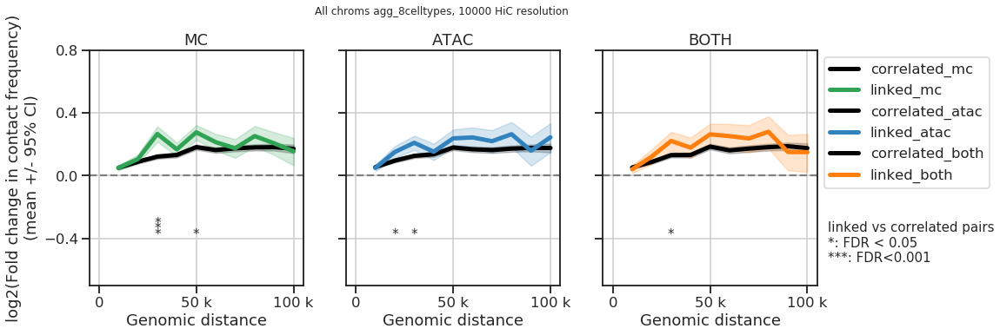

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.20_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


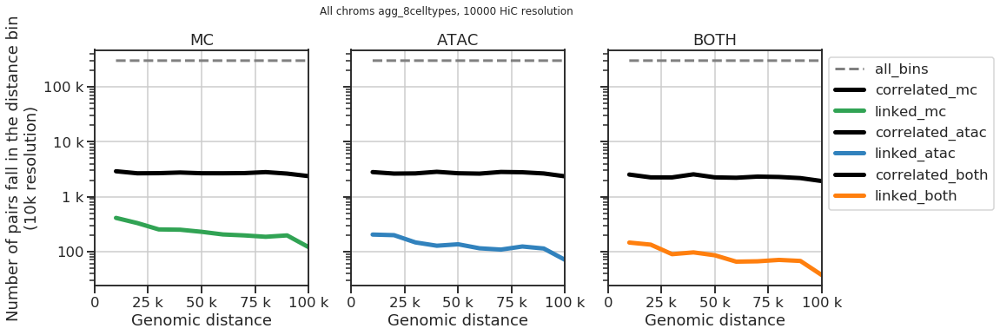

0.25
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.25_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


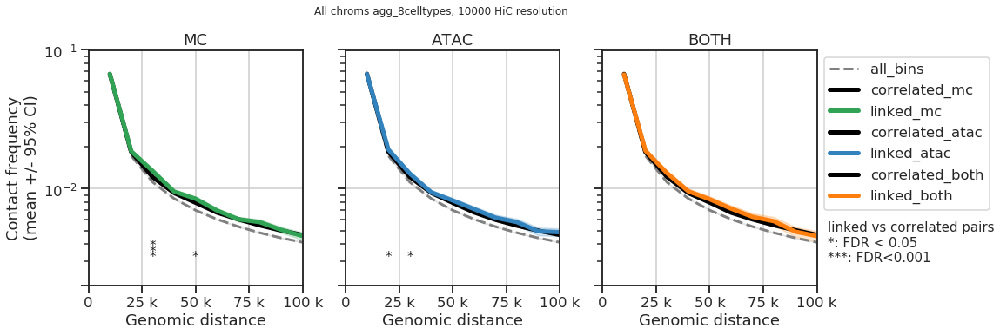

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


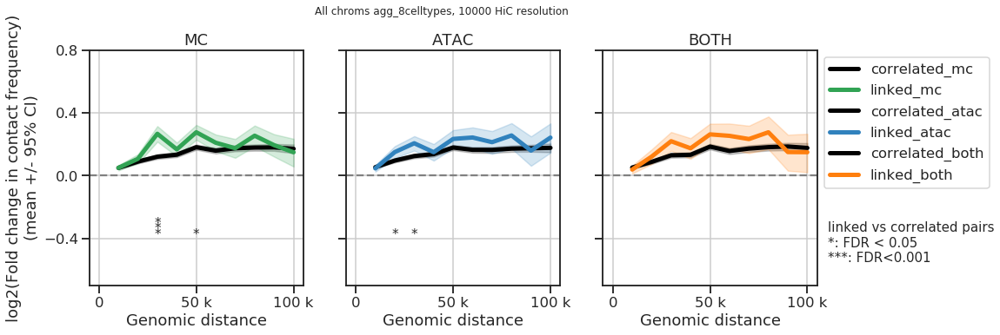

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.25_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


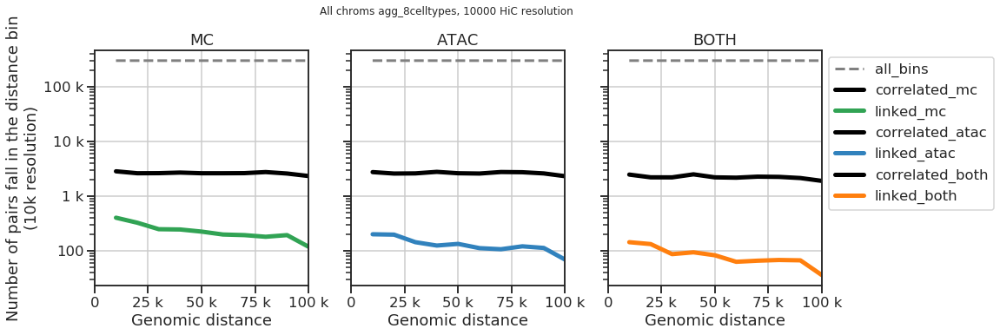

0.3
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.30_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


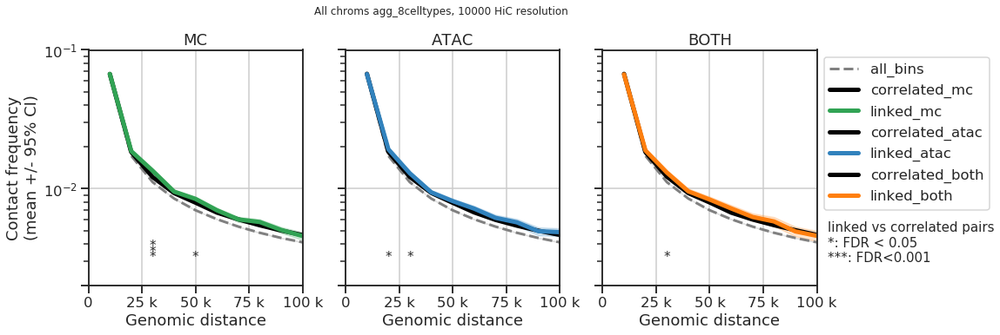

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


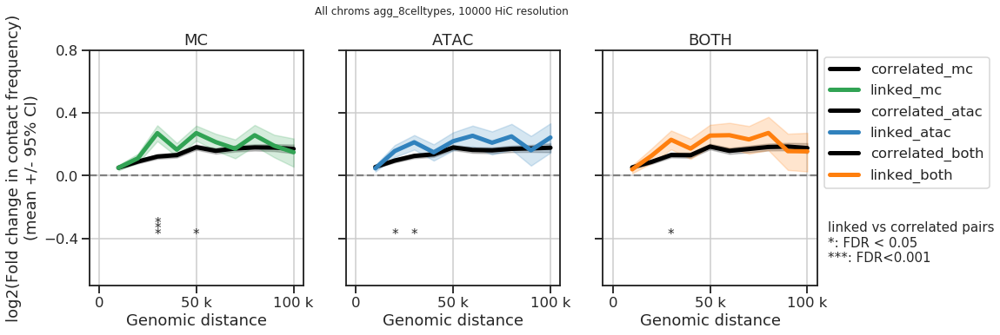

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.30_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


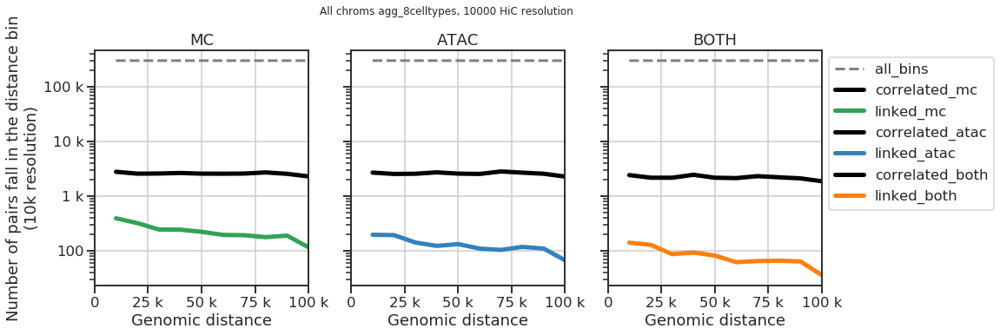

0.35
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.35_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


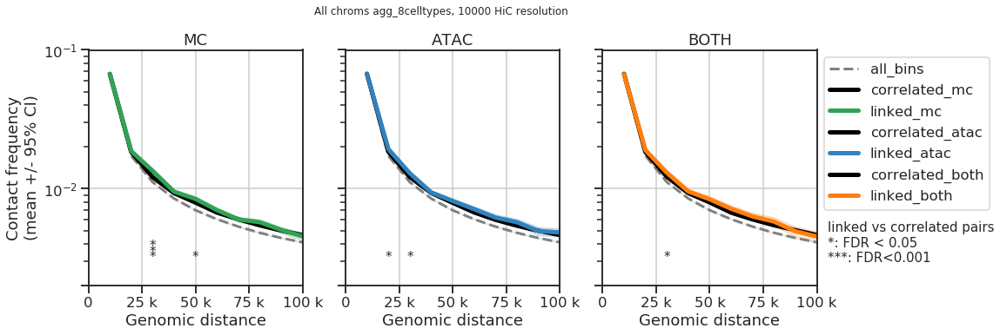

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


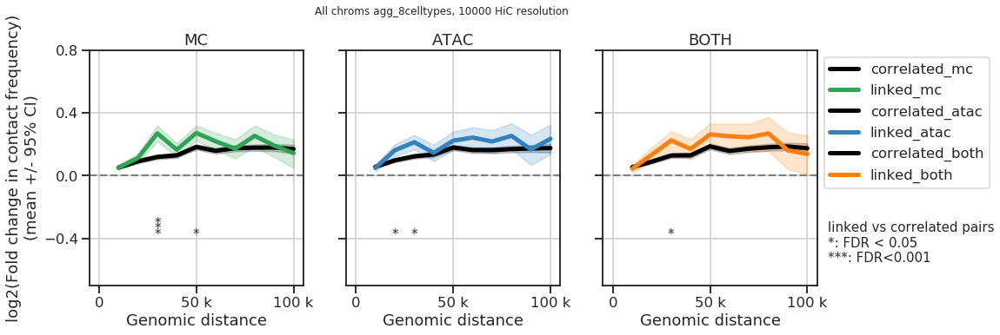

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.35_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


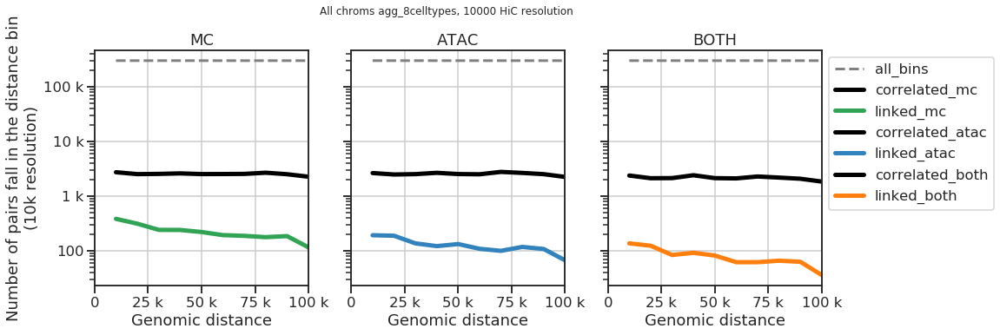

0.4
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.40_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


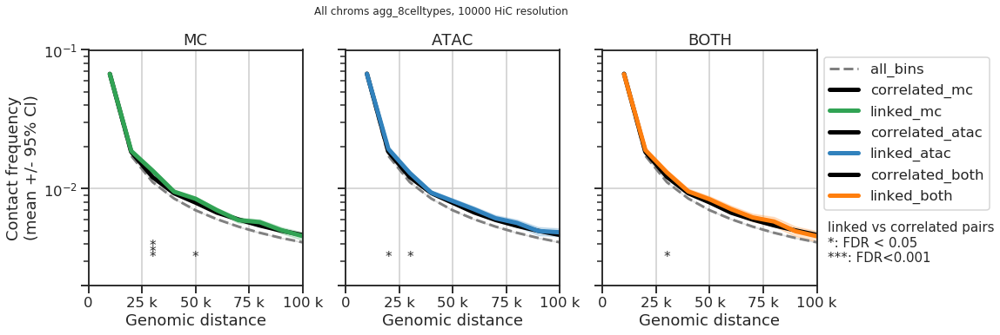

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


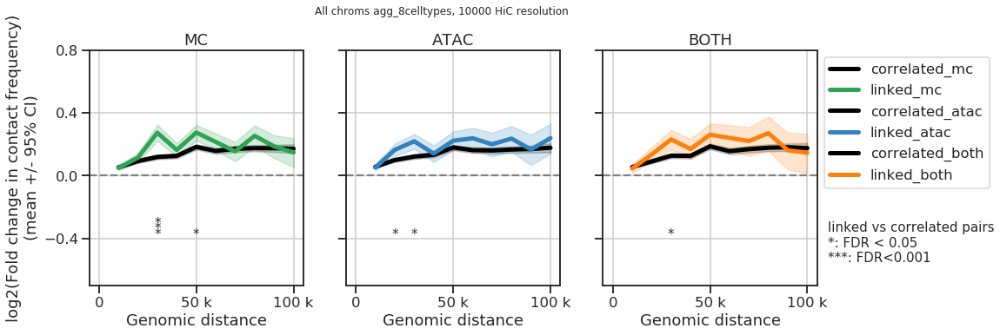

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.40_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


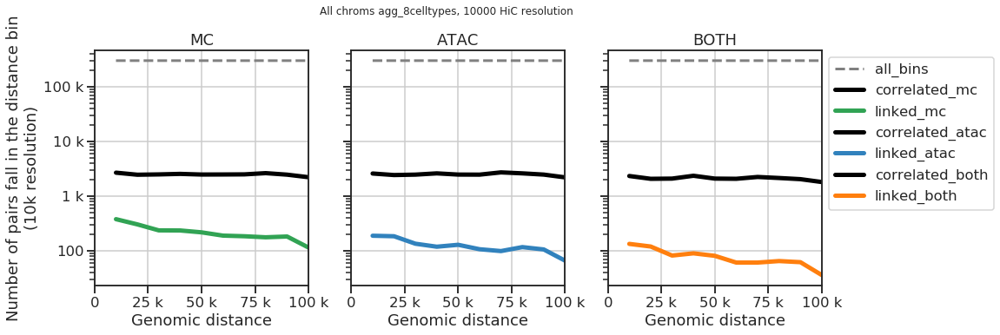

0.45
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.45_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


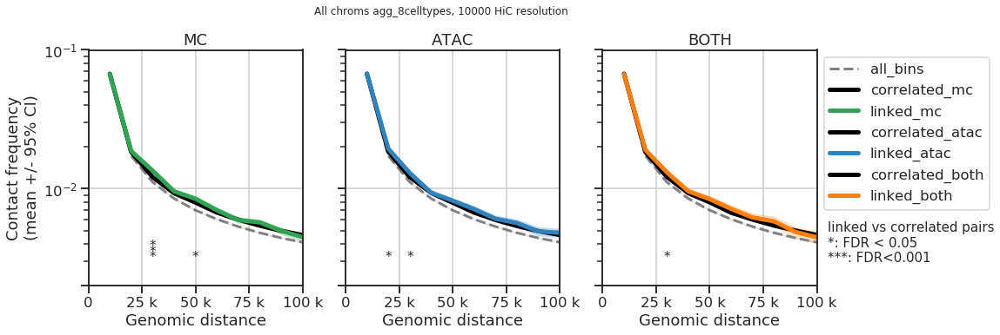

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


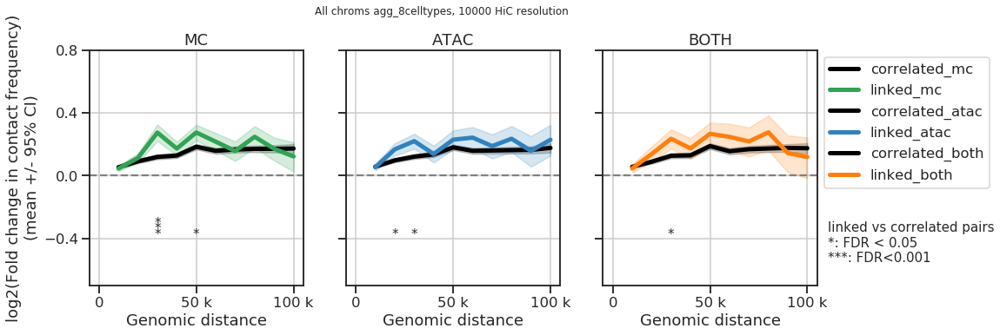

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.45_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


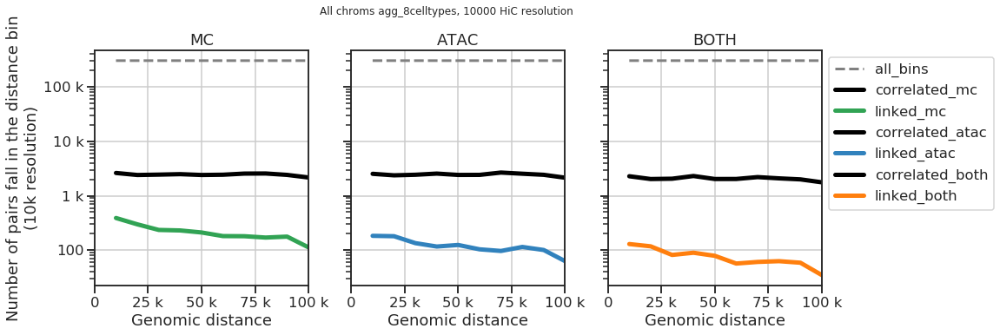

0.5
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.50_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


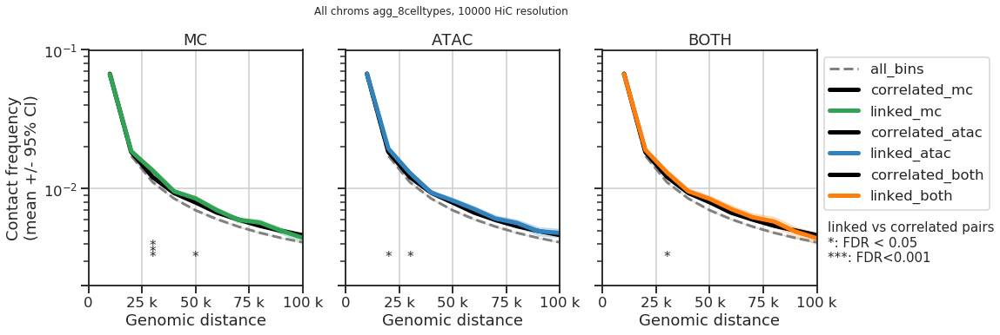

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


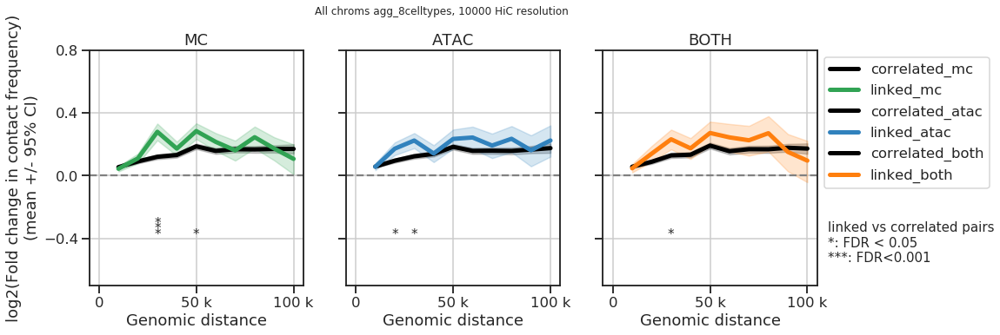

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.50_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


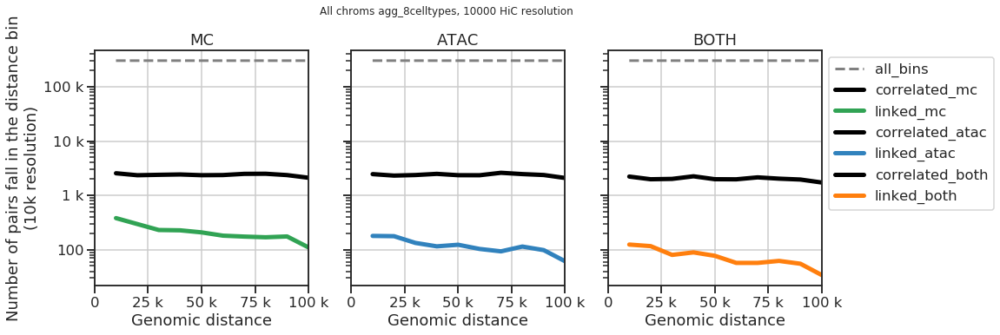

0.55
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.55_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


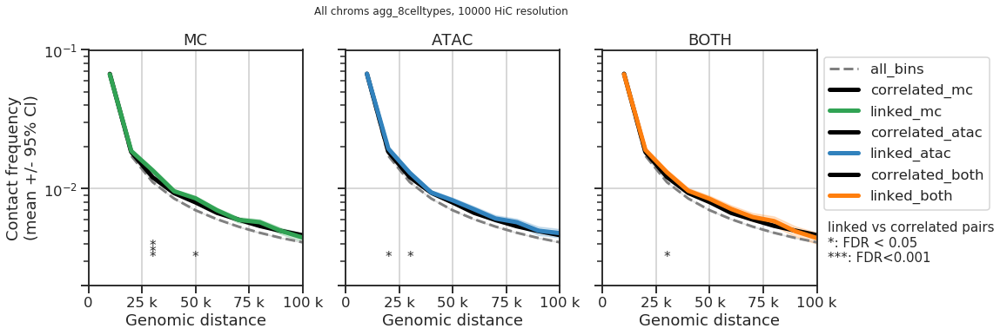

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


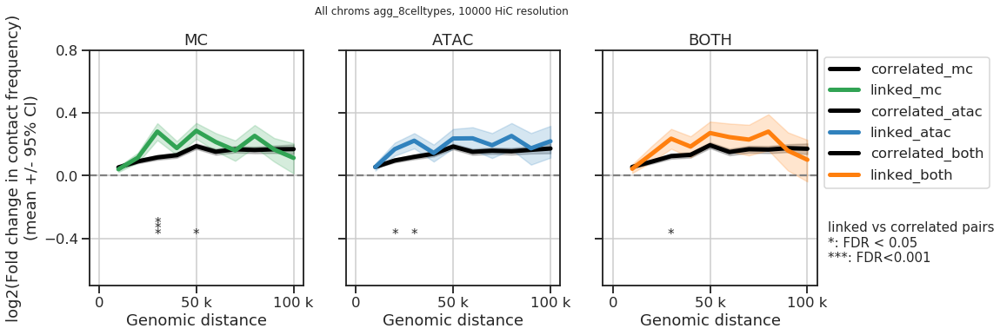

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.55_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


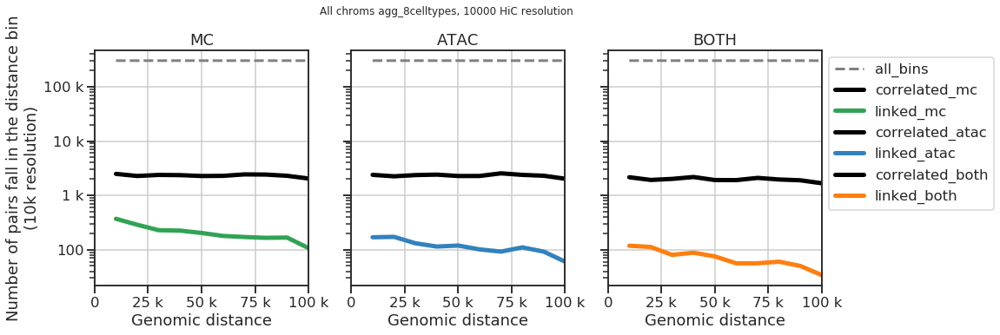

0.6
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.60_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


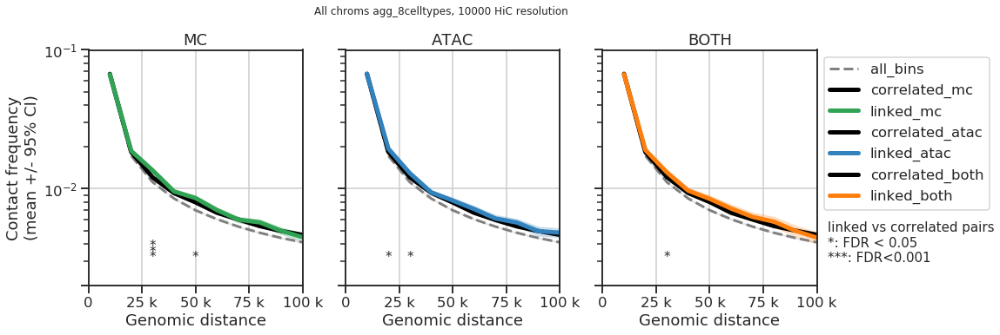

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


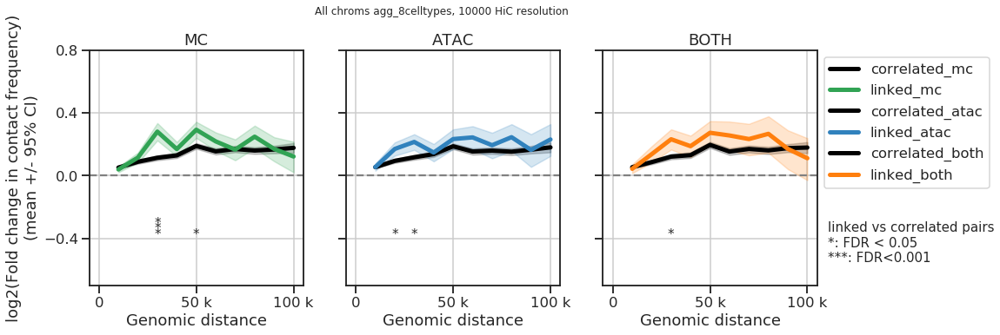

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.60_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


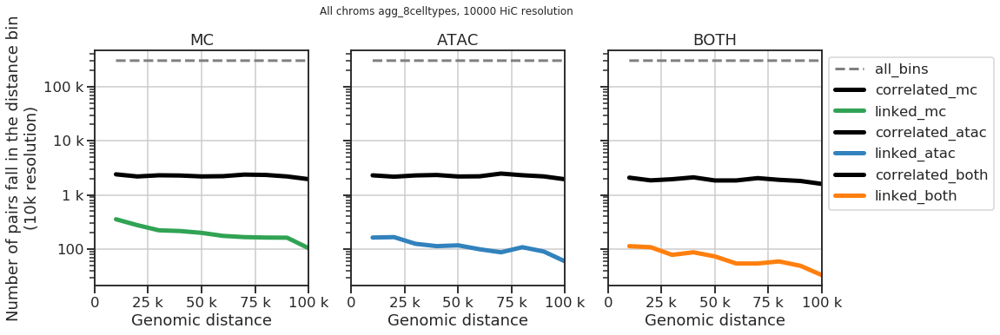

0.65
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.65_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


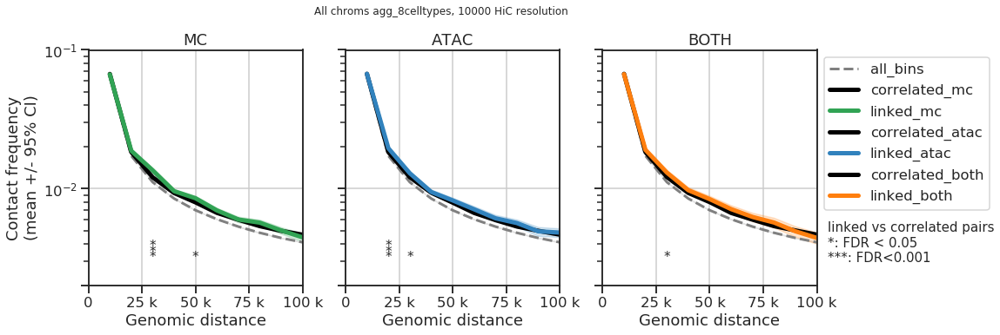

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


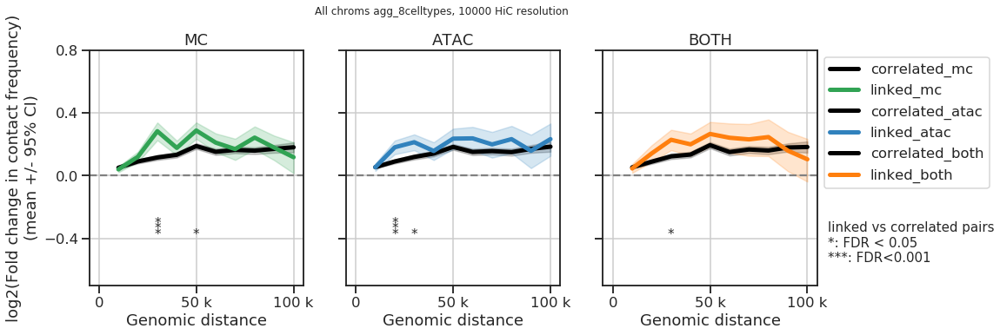

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.65_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


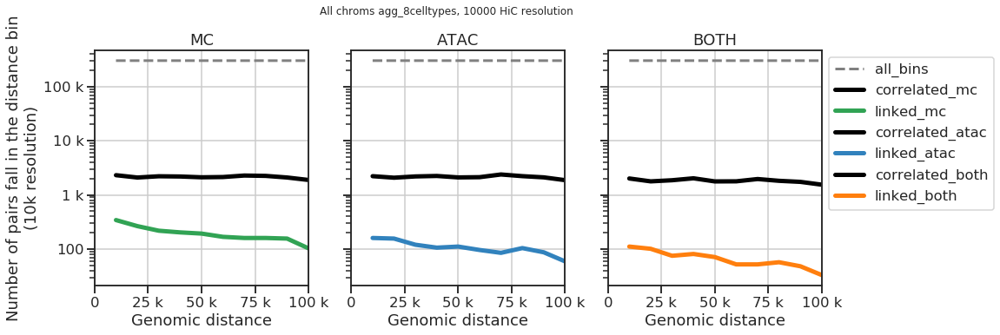

0.7
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.70_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


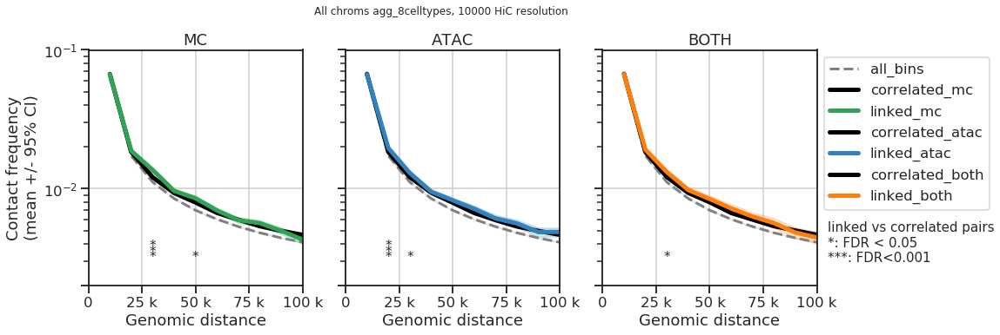

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


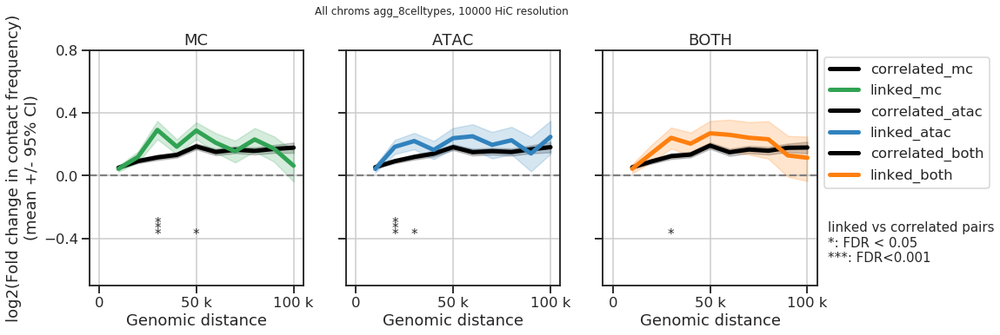

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.70_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


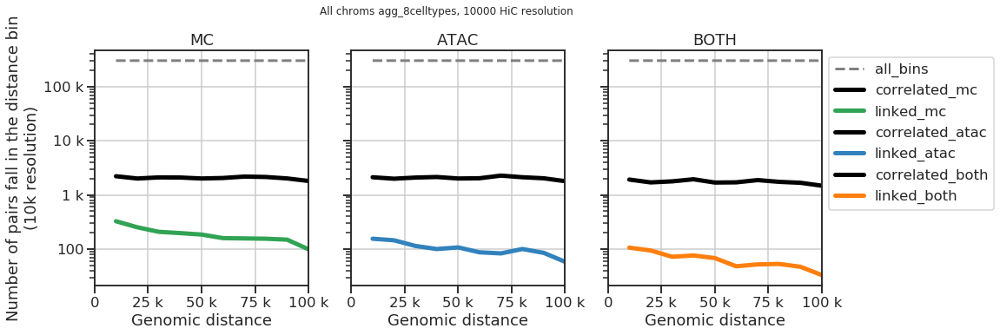

0.75
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.75_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


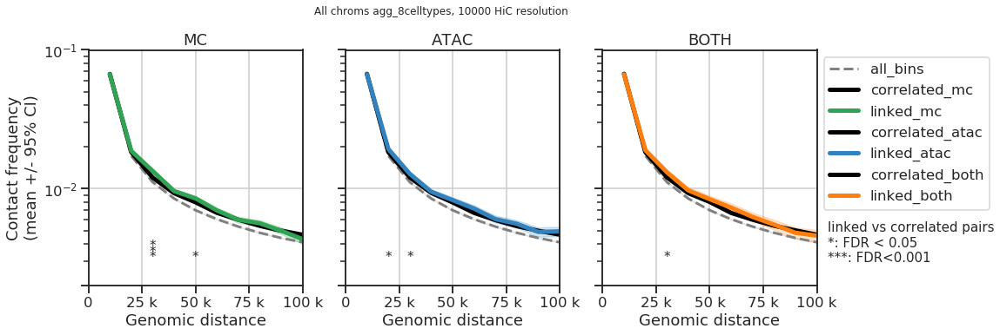

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


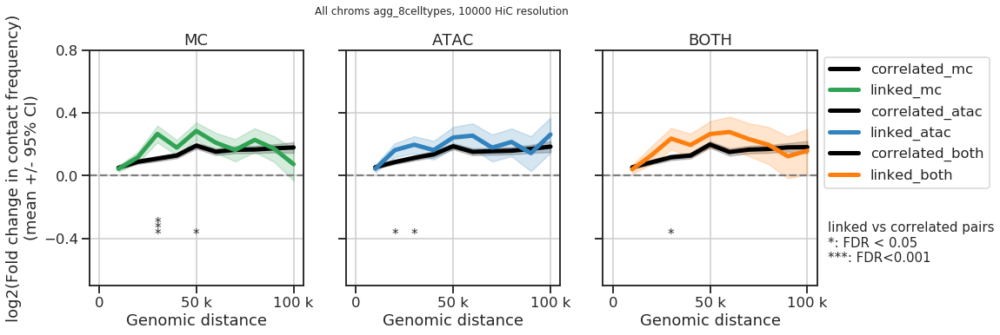

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.75_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


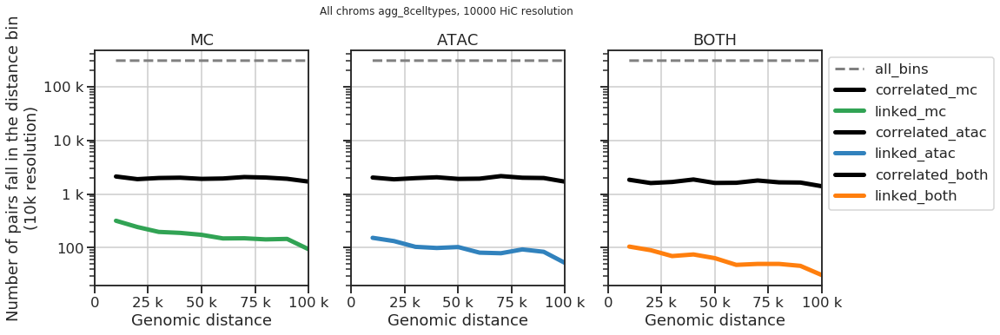

0.8
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


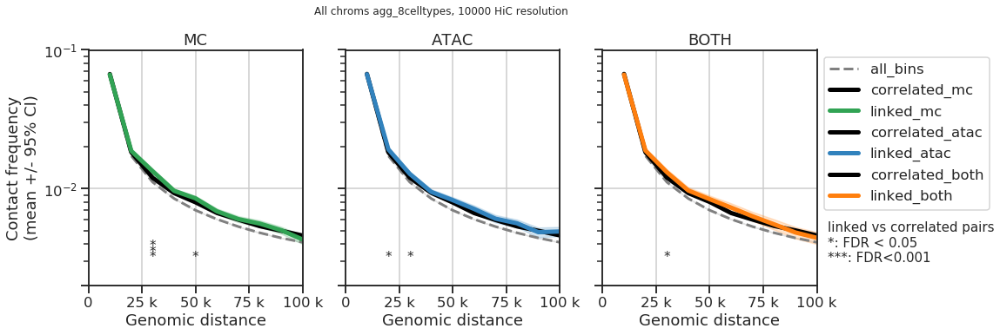

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


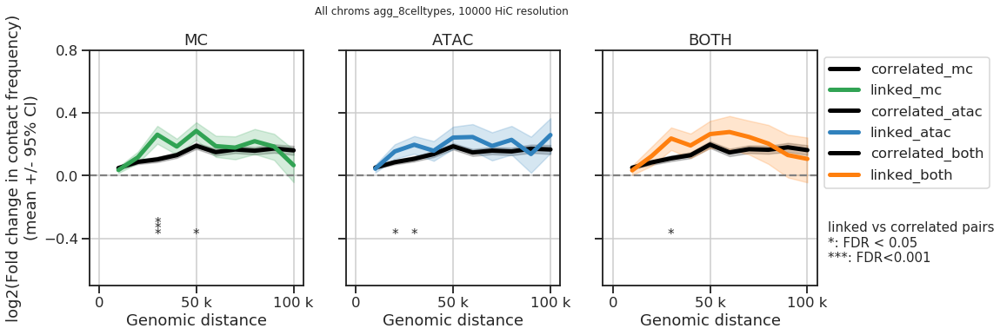

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


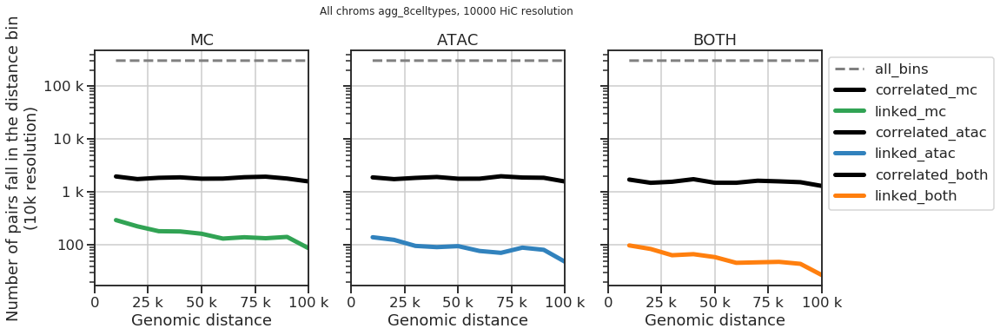

0.85
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.85_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


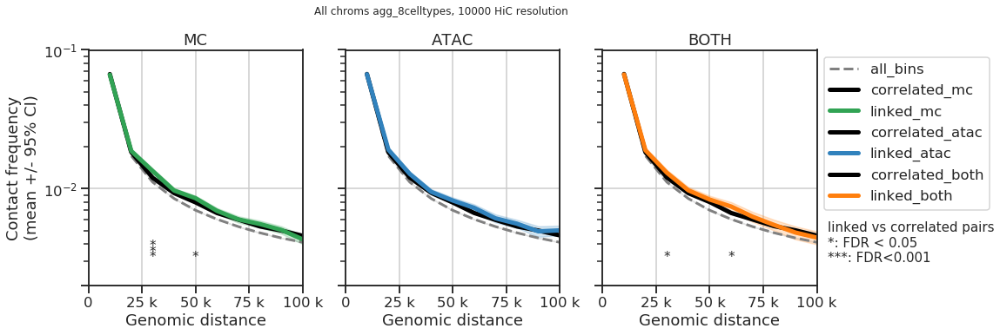

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


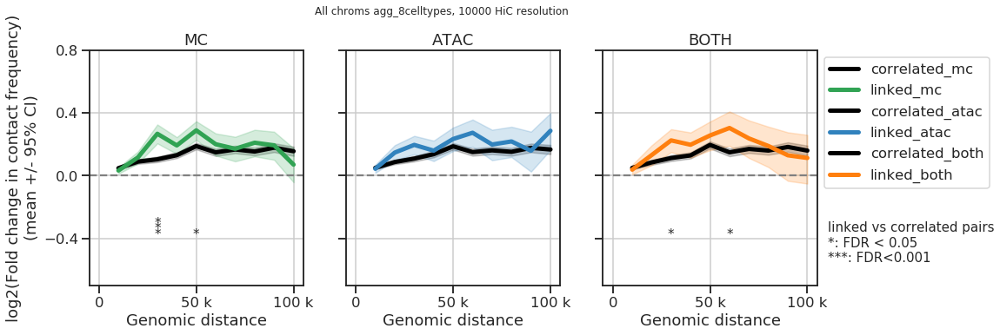

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.85_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


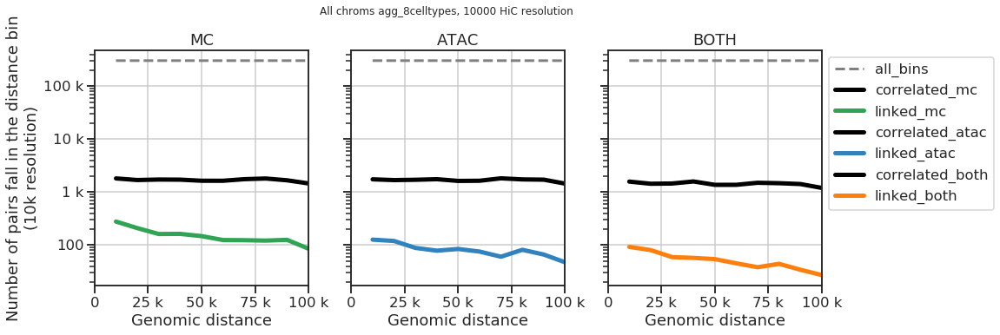

0.9
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.90_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


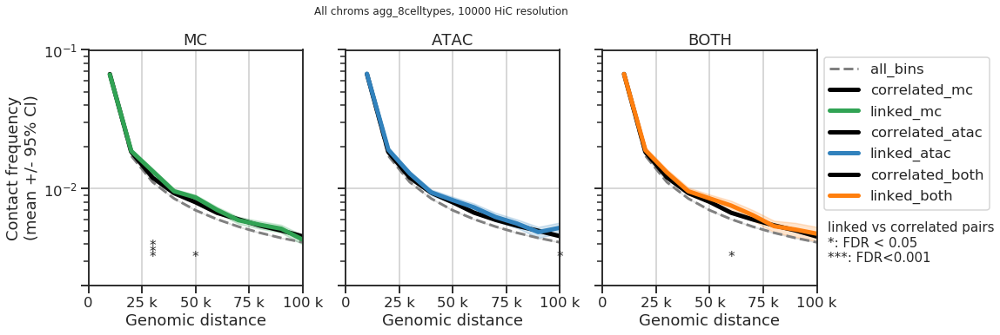

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


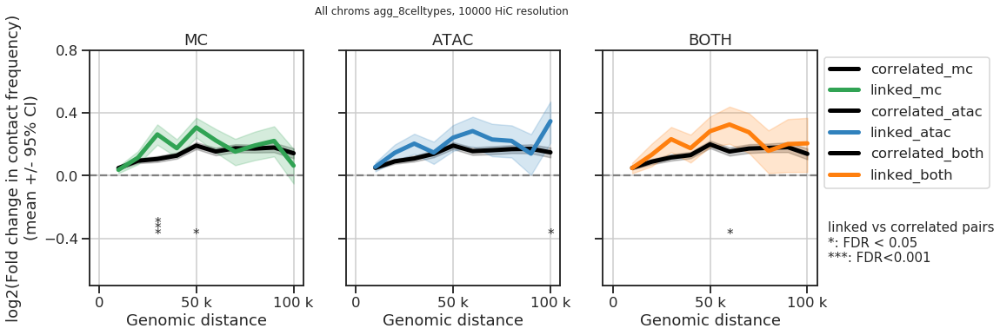

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.90_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


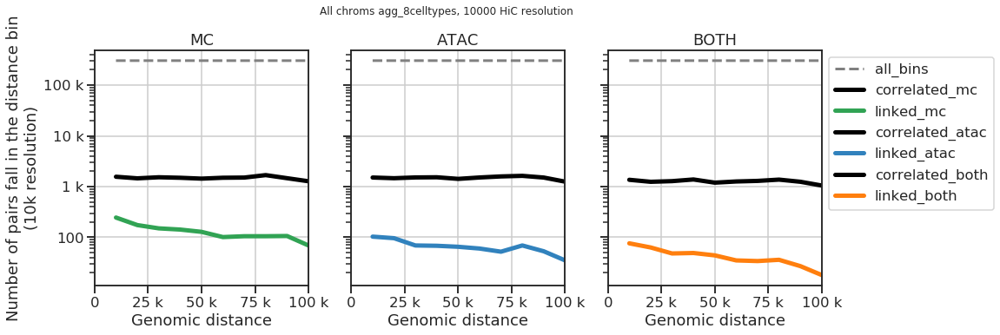

0.95
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.95_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


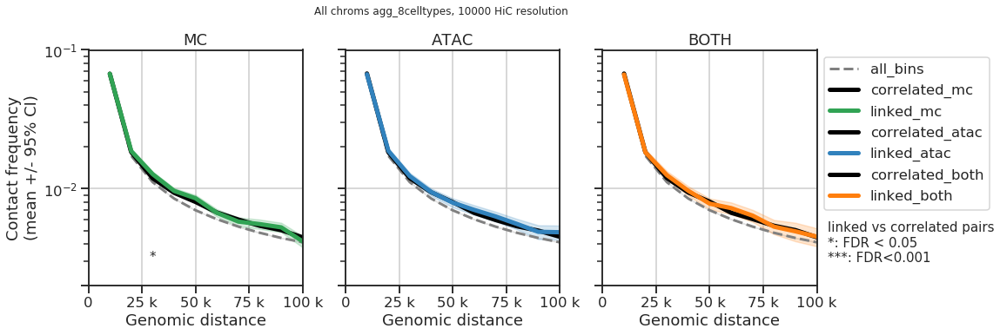

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


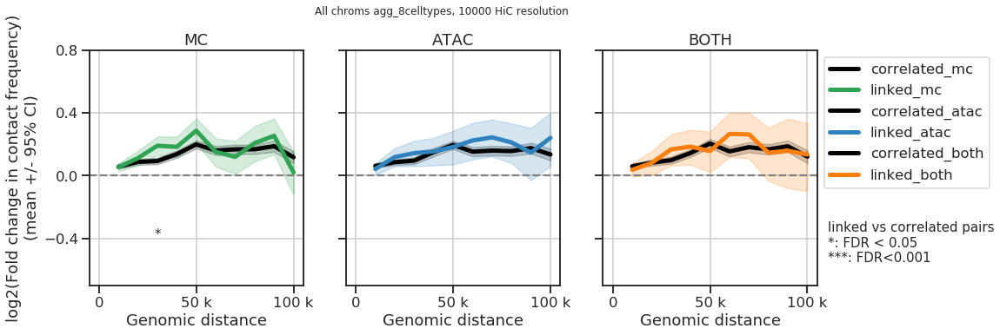

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.95_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


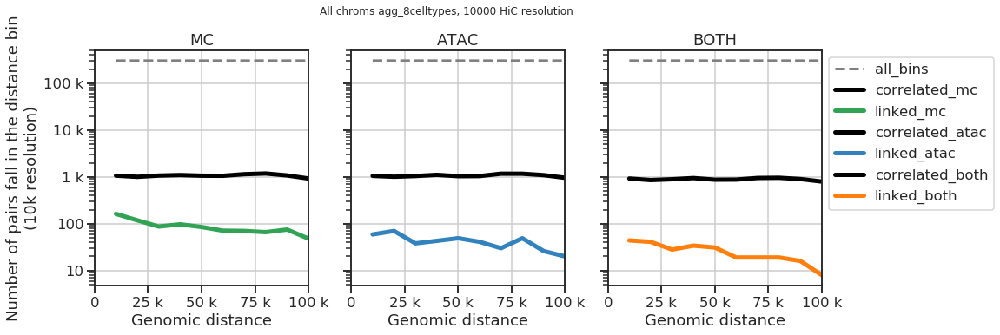

1.0
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover1.00_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_{}.pdf


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/scipy/stats/stats.py:3960: RuntimeWarning: divide by zero encountered in true_divide
  denom = np.sqrt(svar * (1.0 / n1 + 1.0 / n2))


/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


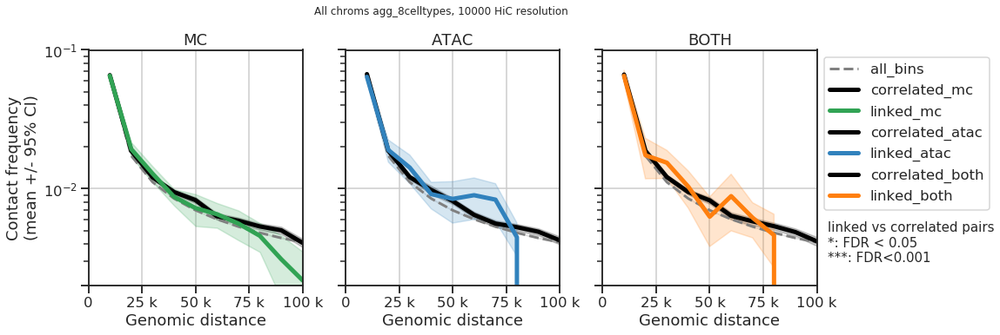

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/cndd2/fangming/venvs/hic_py3p6/lib/python3.6/site-packages/ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in log2


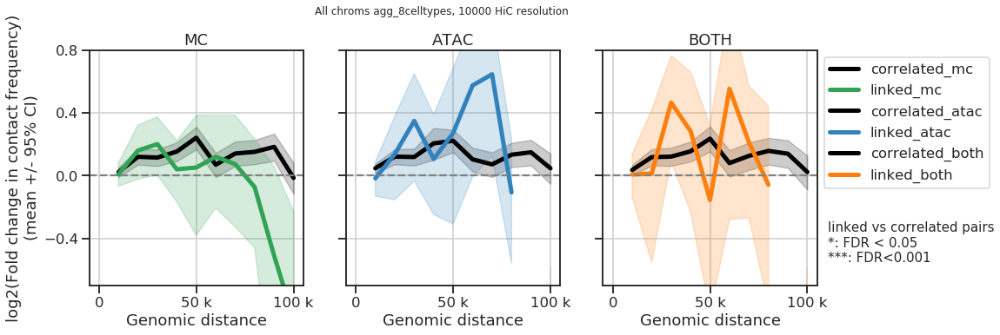

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover1.00_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


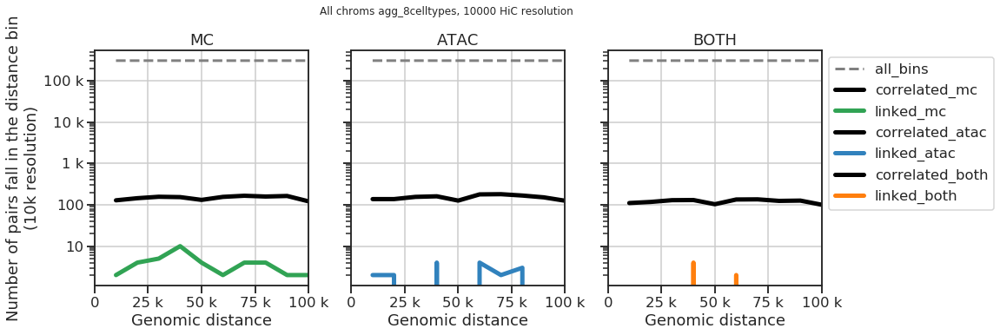

In [25]:


for min_match in min_matches:
    print(min_match)
    input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
                  .format(min_match)
                 )
    print(input_res_format)

    output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                         'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                         .format(min_match)
                        )
    print(output_fig_format)

    # combine all cell types

    contacts_mean_all = []
    contacts_std_all = []
    contacts_n_all = []

    contacts_sig_pairs_mean_all = {track: [] for track in track_names}
    contacts_sig_pairs_std_all = {track: [] for track in track_names}
    contacts_sig_pairs_n_all = {track: [] for track in track_names}


    for celltype in celltypes:
        input_res = input_res_format.format(active_th, celltype, resolution, date)

        # get 
        with open(input_res, 'rb') as fh:
            (distances, 
             contacts_mean, contacts_std, contacts_n,
             contacts_sig_pairs_mean, 
             contacts_sig_pairs_std, 
             contacts_sig_pairs_n, 
            ) = pickle.load(fh)

        # contacts: by regions -> celltype by regions -> by regions
        contacts_mean_all.append(contacts_mean)
        contacts_std_all.append(contacts_std)
        contacts_n_all.append(contacts_n)

        # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
        for key in contacts_sig_pairs_mean.keys():
            contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
            contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
            contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])

    # celltype by region 
    contacts_mean_all = np.array(contacts_mean_all)
    contacts_std_all = np.array(contacts_std_all)
    contacts_n_all = np.array(contacts_n_all)
    for key in contacts_sig_pairs_mean_all.keys():
        contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
        contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
        contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

    # by region
    (contacts_mean_agg, contacts_std_agg, contacts_n_agg,
    ) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)

    # key by region
    contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
    contacts_sig_pairs_std_agg = {track: [] for track in track_names}
    contacts_sig_pairs_n_agg = {track: [] for track in track_names}
    for key in contacts_sig_pairs_mean_all.keys():
        (contacts_sig_pairs_mean_agg[key], 
         contacts_sig_pairs_std_agg[key], 
         contacts_sig_pairs_n_agg[key], 
        ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                      contacts_sig_pairs_std_all[key], 
                                      contacts_sig_pairs_n_all[key], 
                                     )

    p_th1 = 0.05
    p_th2 = 0.001
    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                             contacts_std_agg, 
                                                             contacts_n_agg, 
                                                             contacts_sig_pairs_mean_agg,
                                                             contacts_sig_pairs_std_agg,
                                                             contacts_sig_pairs_n_agg,
                                                             p_th1=p_th1, p_th2=p_th2)
    
    # plot
    celltype = 'agg_8celltypes'
    output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3(distances, celltype, resolution, 
             track_names,
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[2e-3, 1e-1],
             yticks=[2e-3, 1e-2, 1e-1,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[-0.7, 0.8],
             yticks=[-0.4, 0, 0.4, 0.8],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )

# improve on summary 2 
- compare with correlated but not linked


[0.8]
0.8
/sphere/fangming/enhancers/scripts/results_new/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}_{}_{}_{}.pkl
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_{}.pdf
/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3.pdf.pdf


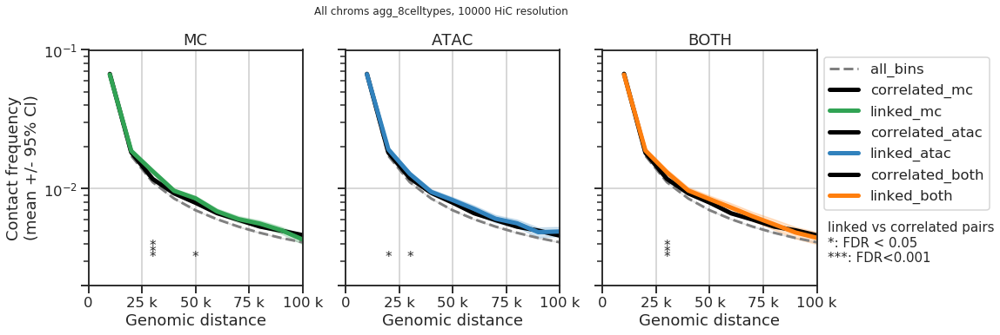

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v4.pdf.pdf


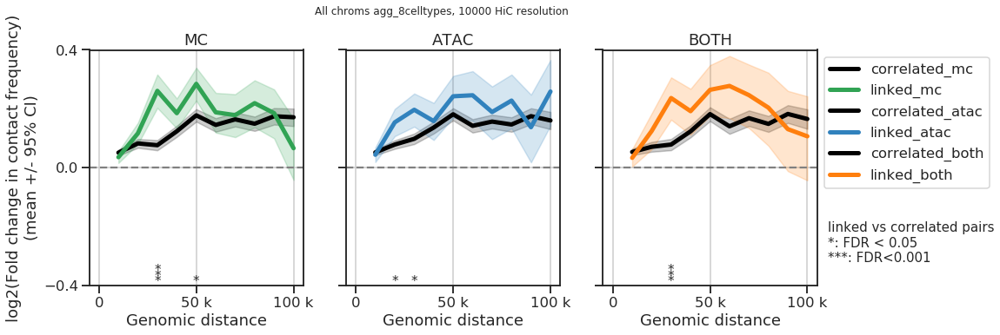

/sphere/fangming/enhancers/scripts/figures/hic_contact_enrichment_metacell_liftover0.80_celltypespec_agg_8celltypes_10000_plot1_v3_cov_test.pdf.pdf


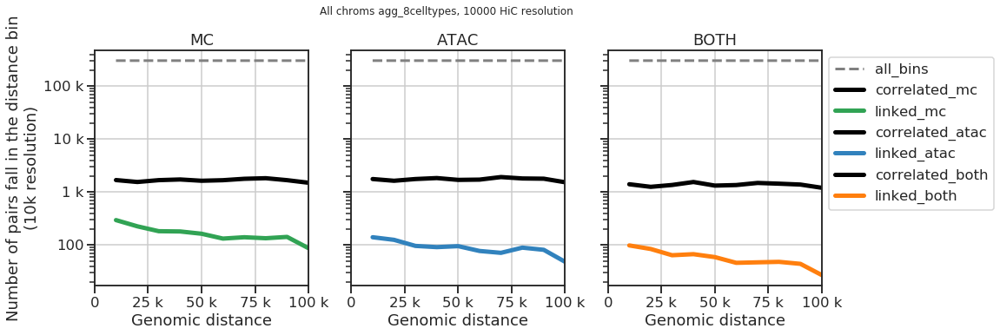

In [41]:
# 

resolution = 10000
active_th = 50
date = '2020-12-15'

# min_matches = np.arange(0.1, 1+0.05, 0.05)
min_matches = [0.80]
print(min_matches)

for min_match in min_matches:
    print(min_match)
    input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
                  .format(min_match)
                 )
    print(input_res_format)

    output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                         'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                         .format(min_match)
                        )
    print(output_fig_format)

    # combine all cell types

    contacts_mean_all = []
    contacts_std_all = []
    contacts_n_all = []

    contacts_sig_pairs_mean_all = {track: [] for track in track_names}
    contacts_sig_pairs_std_all = {track: [] for track in track_names}
    contacts_sig_pairs_n_all = {track: [] for track in track_names}


    for celltype in celltypes:
        input_res = input_res_format.format(active_th, celltype, resolution, date)

        # get 
        with open(input_res, 'rb') as fh:
            (distances, 
             contacts_mean, contacts_std, contacts_n,
             contacts_sig_pairs_mean, 
             contacts_sig_pairs_std, 
             contacts_sig_pairs_n, 
            ) = pickle.load(fh)
        # contacts: by regions -> celltype by regions -> by regions
        contacts_mean_all.append(contacts_mean)
        contacts_std_all.append(contacts_std)
        contacts_n_all.append(contacts_n)

        # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
        for key in contacts_sig_pairs_mean.keys():
            contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
            contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
            contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])

    # celltype by region 
    contacts_mean_all = np.array(contacts_mean_all)
    contacts_std_all = np.array(contacts_std_all)
    contacts_n_all = np.array(contacts_n_all)
    for key in contacts_sig_pairs_mean_all.keys():
        contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
        contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
        contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

    # by region
    (contacts_mean_agg, contacts_std_agg, contacts_n_agg,
    ) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)

    # key by region
    contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
    contacts_sig_pairs_std_agg = {track: [] for track in track_names}
    contacts_sig_pairs_n_agg = {track: [] for track in track_names}
    for key in contacts_sig_pairs_mean_all.keys():
        (contacts_sig_pairs_mean_agg[key], 
         contacts_sig_pairs_std_agg[key], 
         contacts_sig_pairs_n_agg[key], 
        ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                      contacts_sig_pairs_std_all[key], 
                                      contacts_sig_pairs_n_all[key], 
                                     )

    p_th1 = 0.05
    p_th2 = 0.001
    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                             contacts_std_agg, 
                                                             contacts_n_agg, 
                                                             contacts_sig_pairs_mean_agg,
                                                             contacts_sig_pairs_std_agg,
                                                             contacts_sig_pairs_n_agg,
                                                             p_th1=p_th1, p_th2=p_th2)
    
    # plot
    celltype = 'agg_8celltypes'
    output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3(distances, celltype, resolution, 
             track_names,
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[2e-3, 1e-1],
             yticks=[2e-3, 1e-2, 1e-1,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[-0.4, 0.4],
             yticks=[-0.4, 0, 0.4,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )

#

resolution = 10000
active_th = 50
date = '2020-12-17'

# min_matches = np.arange(0.1, 1+0.05, 0.05)
min_matches = [0.80]
print(min_matches)

for min_match in min_matches:
    print(min_match)
    input_res_format = ('/sphere/fangming/enhancers/scripts/results_new/'
                  'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}_{{}}_{{}}_{{}}.pkl' #.format(int(100*active_th), celltype, resolution, today)
                  .format(min_match)
                 )
    print(input_res_format)

    output_fig_format = ('/sphere/fangming/enhancers/scripts/figures/'
                         'hic_contact_enrichment_metacell_liftover{:.2f}_celltypespec_{{}}.pdf' 
                         .format(min_match)
                        )
    print(output_fig_format)

    # combine all cell types

    contacts_mean_all = []
    contacts_std_all = []
    contacts_n_all = []

    contacts_sig_pairs_mean_all = {track: [] for track in track_names}
    contacts_sig_pairs_std_all = {track: [] for track in track_names}
    contacts_sig_pairs_n_all = {track: [] for track in track_names}


    for celltype in celltypes:
        input_res = input_res_format.format(active_th, celltype, resolution, date)

        # get 
        with open(input_res, 'rb') as fh:
            (distances, 
             contacts_mean, contacts_std, contacts_n,
             contacts_sig_pairs_mean, 
             contacts_sig_pairs_std, 
             contacts_sig_pairs_n, 
            ) = pickle.load(fh)
        # contacts: by regions -> celltype by regions -> by regions
        contacts_mean_all.append(contacts_mean)
        contacts_std_all.append(contacts_std)
        contacts_n_all.append(contacts_n)

        # contacts_sig_pairs: key by regions -> key by (celltype by regions) -> key by regions
        for key in contacts_sig_pairs_mean.keys():
            contacts_sig_pairs_mean_all[key].append(contacts_sig_pairs_mean[key])
            contacts_sig_pairs_std_all[key].append(contacts_sig_pairs_std[key])
            contacts_sig_pairs_n_all[key].append(contacts_sig_pairs_n[key])

    # celltype by region 
    contacts_mean_all = np.array(contacts_mean_all)
    contacts_std_all = np.array(contacts_std_all)
    contacts_n_all = np.array(contacts_n_all)
    for key in contacts_sig_pairs_mean_all.keys():
        contacts_sig_pairs_mean_all[key] = np.array(contacts_sig_pairs_mean_all[key])
        contacts_sig_pairs_std_all[key] = np.array(contacts_sig_pairs_std_all[key])
        contacts_sig_pairs_n_all[key] = np.array(contacts_sig_pairs_n_all[key])

    # by region
    (contacts_mean_agg, contacts_std_agg, contacts_n_agg,
    ) = aggregate_mean_std_matrix(contacts_mean_all, contacts_std_all, contacts_n_all)

    # key by region
    contacts_sig_pairs_mean_agg = {track: [] for track in track_names}
    contacts_sig_pairs_std_agg = {track: [] for track in track_names}
    contacts_sig_pairs_n_agg = {track: [] for track in track_names}
    for key in contacts_sig_pairs_mean_all.keys():
        (contacts_sig_pairs_mean_agg[key], 
         contacts_sig_pairs_std_agg[key], 
         contacts_sig_pairs_n_agg[key], 
        ) = aggregate_mean_std_matrix(contacts_sig_pairs_mean_all[key], 
                                      contacts_sig_pairs_std_all[key], 
                                      contacts_sig_pairs_n_all[key], 
                                     )

    p_th1 = 0.05
    p_th2 = 0.001
    (mean_fcs_bck, padjs_bck, 
     mean_fcs_correlated, padjs_correlated,) = ttest_routine(contacts_mean_agg, 
                                                             contacts_std_agg, 
                                                             contacts_n_agg, 
                                                             contacts_sig_pairs_mean_agg,
                                                             contacts_sig_pairs_std_agg,
                                                             contacts_sig_pairs_n_agg,
                                                             p_th1=p_th1, p_th2=p_th2)
    
    # plot
    celltype = 'agg_8celltypes'
    output_fig = output_fig_format.format('{}_{}_plot1_v3.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3(distances, celltype, resolution, 
             track_names,
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[2e-3, 1e-1],
             yticks=[2e-3, 1e-2, 1e-1,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v4.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v4(distances, celltype, resolution, 
             track_names, 
             contacts_mean_agg, contacts_std_agg, contacts_n_agg, 
             contacts_sig_pairs_mean_agg, contacts_sig_pairs_std_agg, contacts_sig_pairs_n_agg,
             padjs_correlated,
             output_fig,
             ylim=[-0.4, 0.4],
             yticks=[-0.4, 0, 0.4,],
             )

    output_fig = output_fig_format.format('{}_{}_plot1_v3_cov_test.pdf'.format(celltype, resolution))
    print(output_fig)
    plot1_v3_cov(distances, celltype, resolution, 
             track_names, 
             contacts_mean, contacts_std, contacts_n, 
             contacts_sig_pairs_mean, contacts_sig_pairs_std, contacts_sig_pairs_n,
             output_fig,
             )